#Before running this code please perfrom the following command in **Anaconda terminal**:

conda create -n tesco python=3.8.8

conda activate tesco

conda install jupyter notebook

jupyter notebook

**General instructions:** 
- This task is intended to be a general DS assessment. If you have applied for an Operational Research role, please contact your recruiter. 
- Please, explain any step or though that you think may be important to evaluate your task. 
- The expected programming language is **python**

- For the sake of the review, we **strongly prefer** to receive back a jupyter notebook containing all the code, comments and thoughts. This notebook should work from end to end, so we can `restart and run all` or  go through it, cell by cell, if we needed to do so.

# TESCO STORES Dataset

At Tesco, the location of a retail store plays a huge role in its commercial success. Our Stores Team use various data sources to better understand the potential of candidate locations for new stores in the UK. They need data science help in designing a model that can predict the future sales **[normalised_sales]** of a store based on location characteristics. Your task is to examine the provided dataset and answer the questions below.

Dataset files
* `tesco-dataset/train.csv`
* `tesco-dataset/test.csv`

Columns
* `location_id`: id of Tesco property location
* `normalised_sales`: normalised sales value of Tesco store
* `crime_rate`: crime rate in the area (higher means more crime)
* `household_size`: mean household size in the area
* `household_affluency`: mean household affluency in the area (higher means more affluent)
* `public_transport_dist`: index of public transport availability in the area
* `proportion_newbuilds`: proportion of newly built property in the area
* `property_value`: average property value in the area
* `commercial_property`: percentage of commercial properties in the area
* `school_proximity`: average school proximity in the area
* `transport_availability`: availability of different transport
* `new_store`: new Tesco store opened recently
* `proportion_nonretail`: proportion of non-retail commercial properties in the area
* `competitor_density`: density of competitor retailers
* `proportion_flats`: proportion of blocks of flats in the area
* `county`: county code of the area

In [1]:
!pip install  shap --user

In [2]:
import shap

In [3]:
!pip install numpy==1.21.2 --user
!pip install pandas==1.3.2 --user
!pip install scipy==1.7.2 --user
!pip install scikit-learn==1.0 --user
!pip install hyperopt==0.2.7 --user
!pip install matplotlib==3.5.2 --user
!pip install seaborn --user

In [4]:
import pandas as pd
import os

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

import numpy as np
from scipy import stats

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor

import math

from hyperopt import fmin, rand, tpe, Trials, hp, STATUS_OK

from time import time

import warnings

## Q1
Before diving into the modelling, you are given the dataset and the Stores Team expect you to come back with an analysis of the data and any concerns you may have about it. They would also like to know which other information you think would be useful to collect for future developments.

## Executive Summary Q1

We perform explanatory analysis in order to find missing values, outliers and relations between covariates and dependent variable **normalised_sales**. 

The features **commercial_property** and **school_proximity** in the training dataset have 29 and 63 missing values. We perform imputation using our function called **imputation** that  is based on the regression between these features and the rest of covariates. But we could use median value as well.

We remove **c_** from values of **county** column and converted them into integer.

Then we investigate how features are correlated with **normalised_sales**. It seems only **location_id** do not correlate with **normalised_sales**. But even if it was correlated we should exclude it from the analysis unless there is information that it relates to **normalised_sales**.

The feature **competitor_density** around 400 has the horizontal lines:
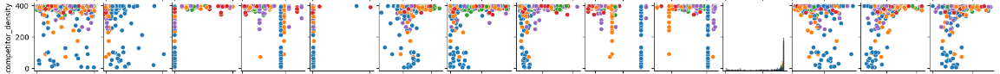. 

It looks inconsistent with other associated values.

We analyse distribution of **new_store** and **transport_availability** (see Fig. 1 and 2). Before preprocessing new and old stores have significantly different values of **normalised_sales** but after removing outliers in **normalised_sales** there is no significant difference. Besides, there are not many **yes** values in **new_store**. Anyway we keeep this feature for future modelling. The feature **transport_availability** does not have the distribution trend with respect to **normalised_sales** (see Fig. 2,a) - expectation of **normalised_sales** does not increase or decrease for the corresponding values of **transport_availability** given in the following order: 'All', 'Average', 'Many', 'No', and 'Few'.

Visual inspection (for example, see Fig. 10) suggest that **normalised_sales** above 1.5 behave abnormally and we remove them from our analysis:

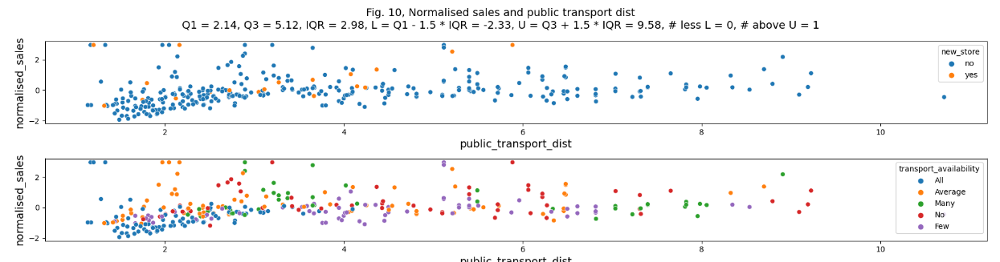

The variable **household_size** <= 1 have strange decreasing trend when the rest has increasing trend. Besides, not sure how to interpret **household_size** <= 1, maybe the average over empty households as well. In our analysis we define **household_size** <= 1 as missing values and perform imputation to fill these values.    

It is clear that **commercial_property** has outliers (see Fig. 7) and we set its value above 26.95 as missing and perform imputation to fill these values:

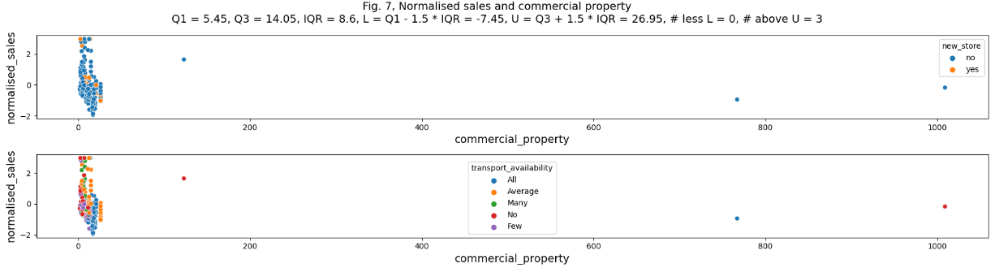

Fig. 3-28 show relationship between **normalised_sales** and the correponding features, where Fig. 3-16 show this relations before outlier removal and imputation and Fig. 17-28 - after per-processing. We can visually inspect Fig. 3-28 for outliers but I also provided statistics based on quantiles and interquantile range. 


**They would also like to know which other information you think would be useful to collect for future developments.**

In ideal case it would be nice to have kind of raw data where we have geocoordinates of shops and their competitors, and monthly normalised_sales and date as well - in this case we can perform spatio-temporal analysis of **normalised_sales**. It would be nice to know demographics of people such as distribution of ages and professions in the area.
Besides, how many house sales - in this case we how many new people in the area. We also need to know about parking conditions.

In [5]:

def compare_variables(df, slice_values, groupby='y', title = "", order = []):
    """
    Plot distributions of features for given groups
    
    ________________
    Inputs:
    
    df is a data frame with columns define by slice_values and groupby;
    slice_values is list of features;
    groupby is categorical variable.
    
    ________________
    Return:
    
    no output
    """
    for gl in slice_values:
        fig, ax = plt.subplots(1,2,figsize=[15,5])
        first_title = title
        if "Fig" in title:
           spl = title.split(",")
           spl[0] += "a"
           first_title = ",".join(spl) 
        if len(order) > 0:
           sns.violinplot(x=groupby, y=gl, data=df, order = order, height = 5, aspect = 1.7, ax = ax[0]).set_title(first_title)
        else:
           sns.violinplot(x=groupby, y=gl, data=df,                height = 5, aspect = 1.7, ax = ax[0]).set_title(first_title) 
        #
        second_title = title
        if "Fig" in title:
           spl = title.split(",")
           spl[0] += "b"
           second_title = ",".join(spl) 
        
        groups = df.groupby(groupby)
        for t in df[groupby].unique():
            dftmp = groups.get_group(t)
            try:
               sns.kdeplot(dftmp[gl], ax = ax[1], shade = True, label = t).set_title(second_title)
            except Exception as e:
               print("Exception: ", str(e))
        #
        ax[1].set_xlabel(gl)
        ax[1].legend(title = groupby)
        #ax[1].set_xlim(xlim[0], xlim[1])
        ax[0].grid()
    return plt

def outlier_IQR(data, train_describe_cols, wo_cols):
    """
    Compute 25th, 75th quantiles and interquantile range in order to perform
    outlier detection.
    ________________
    Inputs:
    
    data is a data frame with feature values;
    train_describe_cols is a list of feature without categorical variables;
    wo_cols is the list of features that are not used for outlier detection.
    
    ________________
    Return:
    
    final is list of dictionaries; 
    IQR_stats is dictionary, where keys are features and 
    values are statistics for the corresponding features.
    """
    final = []
    IQR_stats = {}
    for col in train_describe_cols:
        if not (col in wo_cols):   
           df = data[col].copy() 
           Q1 = df.quantile(0.25)
           Q3 = df.quantile(0.75)
           IQR = Q3-Q1
           low_df   = df[df<(Q1-1.5*IQR)].copy()
           upper_df = df[df>(Q3+1.5*IQR)].copy()
           elem = {"col": col,
                   "Q1": Q1, 
                   "Q3": Q3, 
                   "IQR": IQR, 
                   "Q1-1.5*IQR": Q1 - 1.5 * IQR,
                   "Q3+1.5*IQR": Q3 + 1.5 * IQR,
                   "# below": len(low_df), 
                   "# upper": len(upper_df)}
           
           IQR_stats[col] = elem
           elem["col"] = col
           final.append(elem) 
    return final, IQR_stats


def scatter_plot(train, 
                 train_describe_cols, 
                 IQR_stats, 
                 start_Fig = 3, 
                 wo_cols = ["normalised_sales"], 
                 is_new_store = True, 
                 figsize=(18, 5)):
    """
    Plot scatter plot of normalised sales and the corresponding features.
    In the title we have statistics to help identify outliers.
    
    ________________
    Inputs:
    
    train is a data frame; 
    train_describe_cols is a list of features;
    IQR_stats is outlier detection statistics;
    start_Fig is the first number of pictures;
    wo_cols is the list of features that are excluded from plotting;
    is_new_store is True when we want to plot feature and normalised sales
    with respect to is_new_store value and not plot otherwise;
    figsize  is the figure size.
    
    ________________
    Return:
    
    no output
    """
    
    for i, col in enumerate(train_describe_cols):
        if not (col in wo_cols): 
           plt.figure(i, figsize=figsize) 
           title = "Q1 = "                 + str(np.round(IQR_stats[col]["Q1"],2)) + \
                 ", Q3 = "                 + str(np.round(IQR_stats[col]["Q3"],2)) + \
                 ", IQR = "                + str(np.round(IQR_stats[col]["IQR"],2)) + \
                 ", L = Q1 - 1.5 * IQR = "   + str(np.round(IQR_stats[col]["Q1-1.5*IQR"],2)) + \
                 ", U = Q3 + 1.5 * IQR = " + str(np.round(IQR_stats[col]["Q3+1.5*IQR"],2)) + \
                 ", # less L = " + str(IQR_stats[col]["# below"]) + \
                 ", # above U = " + str(IQR_stats[col]["# upper"])
           title = "Fig. " + str(start_Fig) + ", Normalised sales and " + col.replace("_", " ") + "\n"+ title 
           start_Fig += 1
           plt.suptitle(title, fontsize=14)
           if is_new_store: 
              plt.subplot(211)
              sns.scatterplot(data = train, x = col, y="normalised_sales", hue="new_store")
              plt.xlabel(col, fontsize=14)
              plt.ylabel("normalised_sales", fontsize=14)
            
              plt.subplot(212)
           
           sns.scatterplot(data = train, x = col, y="normalised_sales", hue= "transport_availability")
    
           plt.xlabel(col, fontsize=14)
           plt.ylabel("normalised_sales", fontsize=14)
            
           plt.tight_layout()
           plt.show()
 
def imputation(sub_train, sub_train_describe_cols, imp = None):
    """
    Perform imputation of missing values.
    ________________
    Inputs:
    
    sub_train is the data frame;
    sub_train_describe_cols is the list of features;
    imp is the imputational model, we made the model for the training dataset 
    (in this case input imp is None) and apply it to both train and
    test dataset.
    
    ________________
    Return:
    
    wo_sub_train is the dataframe where we have imputed missing values;
    imp is the imputation model.
    """
    
    sub_train_describe_cols = [col for col in sub_train_describe_cols if col != 'normalised_sales']   

    
    X = sub_train[sub_train_describe_cols].values.copy()
    print("sub_train_describe_cols: ", sub_train_describe_cols)
    if imp is None:
       imp = IterativeImputer(max_iter=10, random_state=0)
       imp.fit(X)
        
    X = imp.transform(X)
    wo_sub_train = pd.DataFrame(X, columns = sub_train_describe_cols, index = sub_train.index)
    wo_sub_train["transport_availability"] = sub_train["transport_availability"].copy()
    wo_sub_train["new_store"] = sub_train["new_store"].copy()
    
    return wo_sub_train, imp

def preprocessing(train, train_describe_cols, imp = None):
    """
    Remove suspecious data and perform imputation
    ________________
    Inputs:
    
    train is the data frame;
    train_describe_cols is the list of features;
    imp is the imputational model, we made the model for the training dataset 
    (in this case input imp is None) and apply it to both train and
    test dataset.
    
    ________________
    Return:
    
    sub_train is the dataframe with imputed data;
    sub_train_describe_cols is the list of features;
    imp is the imputational model.
    """
    
    sub_train = train[(train["normalised_sales"] <= 1.5) & (train["household_size"] >= 1)].copy()

    sub_train = sub_train[sub_train["household_size"] >= 1].copy()

    sub_train.loc[sub_train["commercial_property"] > 26.95, "commercial_property"] = np.nan
    sub_train.loc[sub_train["household_size"]      < 1,     "household_size"     ] = np.nan

    sub_train_describe_cols = [col for col in train_describe_cols if not((col == "location_id") or (col == "transport_availability"))]

    wo_sub_train, imp = imputation(sub_train, sub_train_describe_cols, imp)
    wo_sub_train['normalised_sales'] = sub_train['normalised_sales'].copy()
    sub_train = wo_sub_train.copy()
    del wo_sub_train
   
    sub_train_describe_cols = sub_train_describe_cols + ["transport_availability"] + ["new_store"]

    return sub_train, sub_train_describe_cols, imp
    

# Read training dataset

In [6]:
path = "data/tesco-dataset"
train_name = "train.csv"

path_train_name = os.path.join(path, train_name)
train = pd.read_csv(path_train_name)

train

,location_id,crime_rate,proportion_flats,proportion_nonretail,new_store,commercial_property,household_size,proportion_newbuilds,public_transport_dist,transport_availability,property_value,school_proximity,competitor_density,household_affluency,normalised_sales,county
0,464,17.600541,0.0,18.10,no,NaN,2.926,29.0,2.9084,All transport options,666,20.2,368.74,4.5325,-0.399933,c_40
1,504,0.603556,20.0,3.97,no,14.85,4.520,10.6,2.1398,Average transport options,264,13.0,388.37,1.8150,2.216308,c_80
2,295,0.606810,0.0,6.20,no,7.70,2.981,31.9,3.6715,Many transport options,307,17.4,378.35,2.9125,0.166920,c_53
3,187,0.012385,55.0,2.25,no,1.95,3.453,68.1,7.3073,No transport options,300,15.3,394.72,2.0575,-0.083804,c_65
4,193,0.016182,100.0,1.32,no,3.05,3.816,59.5,8.3248,Average transport options,256,15.1,392.90,0.9875,0.962693,c_97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
315,106,0.102468,45.0,3.44,no,NaN,3.951,78.5,6.4798,Average transport options,398,15.2,377.68,1.2750,1.551347,c_68
316,24,0.621579,20.0,3.97,no,14.85,4.206,8.4,1.9301,Average transport options,264,13.0,387.89,2.0250,1.496842,c_99
317,473,0.907062,0.0,8.14,no,NaN,2.456,63.4,3.7965,Few transport options,307,21.0,288.99,2.9225,-0.280022,c_36
318,76,0.105079,0.0,25.65,no,11.55,2.961,7.1,2.0869,No transport options,188,NaN,378.09,4.4825,-0.247319,c_69


# Check missing values in training dataset

We look at what columns has missing values and how many of them.

In [7]:
print(train["county"].nunique(), len(train)) 
print("Columns with missing values: ", train.columns[train.isnull().any()])
missing = train.isnull().sum()
print(missing)

98 320
Columns with missing values:  Index(['commercial_property', 'school_proximity'], dtype='object')
location_id                0
crime_rate                 0
proportion_flats           0
proportion_nonretail       0
new_store                  0
commercial_property       29
household_size             0
proportion_newbuilds       0
public_transport_dist      0
transport_availability     0
property_value             0
school_proximity          63
competitor_density         0
household_affluency        0
normalised_sales           0
county                     0
dtype: int64


# Compute descriptive statistics for the training dataset to get feel for the data.



Convert **county** to integer.
If there is large difference between 75% and max value it can be an indicator that the corresponding feature has an outlier.

In [8]:
train["county"] = train["county"].apply(lambda x: int(x.replace("c_", "")) )
train_describe = train.describe()
train_describe_cols =list(train_describe.columns)
print(train_describe_cols)
display(train.describe())

['location_id', 'crime_rate', 'proportion_flats', 'proportion_nonretail', 'commercial_property', 'household_size', 'proportion_newbuilds', 'public_transport_dist', 'property_value', 'school_proximity', 'competitor_density', 'household_affluency', 'normalised_sales', 'county']


,location_id,crime_rate,proportion_flats,proportion_nonretail,commercial_property,household_size,proportion_newbuilds,public_transport_dist,property_value,school_proximity,competitor_density,household_affluency,normalised_sales,county
count,320.000000,320.000000,320.000000,320.000000,291.000000,320.000000,320.000000,320.000000,320.000000,257.000000,320.000000,320.000000,320.000000,320.000000
mean,252.387500,3.596375,10.673438,11.307906,16.868557,3.252803,31.849063,3.718765,408.834375,18.589494,359.657562,3.144008,-0.016967,60.878125
std,145.600582,7.176342,22.579232,7.032693,73.806051,0.695442,27.845777,1.984765,170.888974,2.075529,86.048632,1.774041,0.978561,24.090884
min,1.000000,0.007142,0.000000,0.740000,1.750000,0.561000,0.000000,1.137000,188.000000,13.000000,3.500000,0.432500,-1.936974,0.000000
25%,126.500000,0.087937,0.000000,5.130000,5.450000,2.879750,6.350000,2.138075,277.000000,17.400000,376.722500,1.803750,-0.585250,45.000000
50%,251.500000,0.289681,0.000000,9.900000,9.400000,3.197500,23.400000,3.095750,330.000000,19.100000,392.205000,2.808750,-0.143759,60.000000
75%,377.250000,4.063553,12.500000,18.100000,14.050000,3.597250,54.450000,5.116700,666.000000,20.200000,396.352500,4.091875,0.243227,73.000000
max,506.000000,51.693093,100.000000,27.740000,1009.000000,5.725000,94.000000,10.710300,711.000000,21.200000,396.900000,9.492500,2.968477,144.000000


# Analyse how strong is relation between covariates and dependent variables

We also check if some features are very correlated. Some methods like linear and logistic regression have unstable results if we have high correltion between covariates. In this case we can apply PCA to make feature uncorellated and reduce the number of features.

<AxesSubplot:>

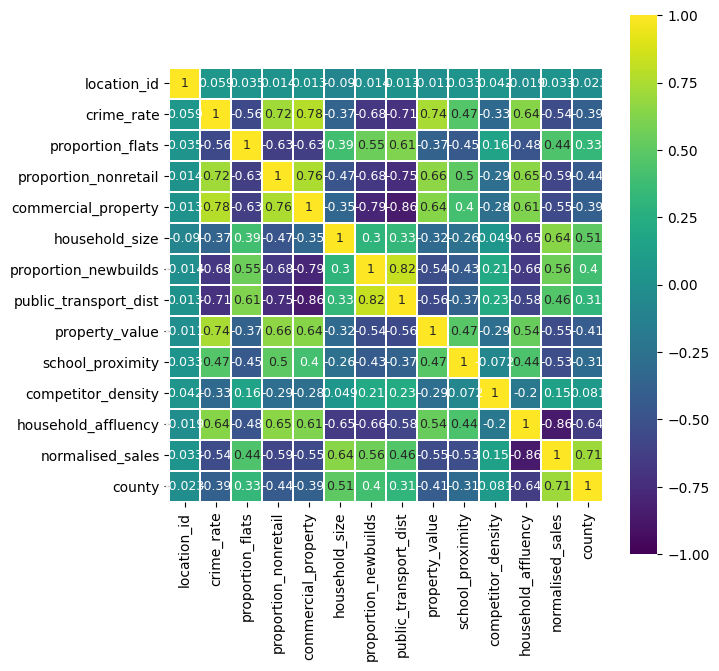

In [9]:
corr =  train[train_describe_cols].corr(method = "spearman")
plt.figure(figsize = (7,7))
sns.heatmap(corr, 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 9}, square=True)

# Remove " transport options" from values of transport_availability. 

We need this for visualization purpose.

In [10]:
train["transport_availability"] = train["transport_availability"].apply(lambda x: x.replace(" transport options", ""))
print("transport_availability: ", train["transport_availability"].unique())
train["transport_availability"].value_counts()

transport_availability:  ['All' 'Average' 'Many' 'No' 'Few']


All        84
Average    72
Few        69
No         53
Many       42
Name: transport_availability, dtype: int64

# Compare distribution of normalised_sales with respect to new_store and transport_availability.

Trying to see if there is simple relation between these features and normalised_sales.

<module 'matplotlib.pyplot' from 'C:\\Users\\alexd\\AppData\\Roaming\\Python\\Python38\\site-packages\\matplotlib\\pyplot.py'>

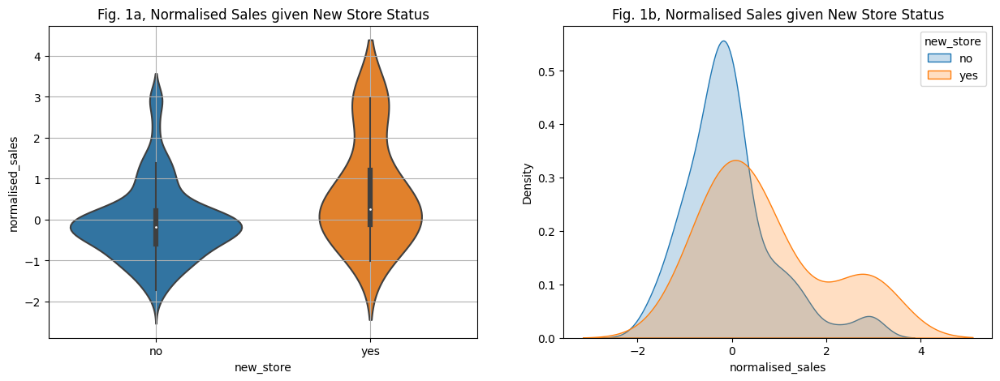

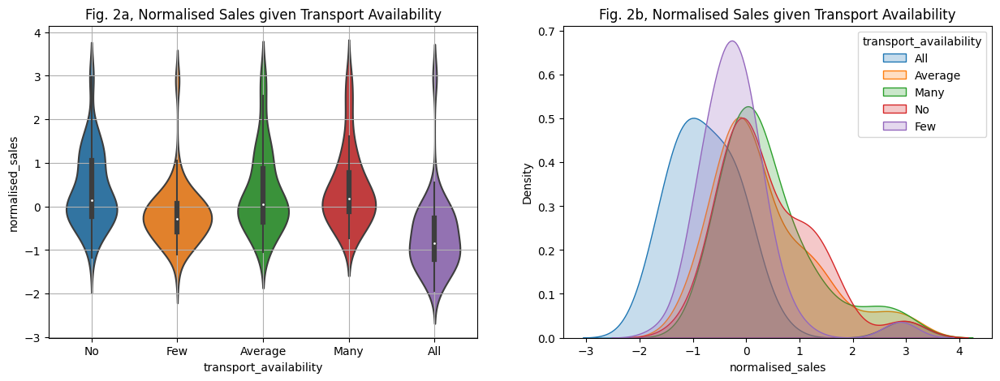

In [11]:
slice_values = ["normalised_sales"]

transport_options = ["No", "Few", "Average", "Many", "All"]

compare_variables(train, slice_values, groupby="new_store", title = "Fig. 1, Normalised Sales given New Store Status")
compare_variables(train, slice_values, groupby="transport_availability", 
                  title = "Fig. 2, Normalised Sales given Transport Availability",
                  order = transport_options)

# Check if there is significant difference between normalised_sales for different groups of new_store values.

It seems, there is significant difference p value is below 0.05 but later when we remove outliers we cannot regect the hypothesis that there is no difference.

In [12]:
rng = np.random.default_rng()

new_store_no = train[train["new_store"] == "no"]["normalised_sales"].values.copy()
new_store_yes= train[train["new_store"] == "yes"]["normalised_sales"].values.copy()

stats.ttest_ind(new_store_no, new_store_yes, permutations=10000, random_state=rng)

Ttest_indResult(statistic=-3.314237991781344, pvalue=0.001)

In [13]:
new_store_stats = train.groupby(["new_store"])["normalised_sales"].describe()
display(new_store_stats)

transport_options_stats = train.groupby(["transport_availability"])["normalised_sales"].describe()
display(transport_options_stats.loc[transport_options,:])

iterables = [["no", "yes"], transport_options]
index = pd.MultiIndex.from_product(iterables, names=["first", "second"])

describe_stats = train.groupby(["new_store", "transport_availability"])["normalised_sales"].describe()
describe_stats.loc[index,:]

,count,mean,std,min,25%,50%,75%,max
new_store,,,,,,,,
no,301.0,-0.06182,0.941066,-1.936974,-0.596151,-0.171012,0.210524,2.968477
yes,19.0,0.69361,1.282108,-1.021290,-0.116507,0.254128,1.202515,2.968477


,count,mean,std,min,25%,50%,75%,max
transport_availability,,,,,,,,
No,53.0,0.392138,0.879665,-1.184805,-0.236418,0.134217,1.060802,2.968477
Few,69.0,-0.189338,0.719834,-1.599043,-0.585250,-0.290923,0.068811,2.968477
Average,72.0,0.332403,0.963778,-1.053993,-0.356329,0.052459,0.872759,2.968477
Many,42.0,0.424131,0.901843,-0.737864,-0.113781,0.172370,0.769200,2.968477
All,84.0,-0.653511,0.910339,-1.936974,-1.212057,-0.841423,-0.269121,2.968477


count      mean       std       min       25%       50%  \
first second                                                             
no    No        51.0  0.322740  0.805328 -1.184805 -0.241868  0.123316   
      Few       66.0 -0.210817  0.717885 -1.599043 -0.585250 -0.301824   
      Average   66.0  0.296410  0.887751 -1.053993 -0.348153  0.041558   
      Many      38.0  0.433707  0.943656 -0.737864 -0.154660  0.166920   
      All       80.0 -0.714972  0.831685 -1.936974 -1.233859 -0.906829   
yes   No         2.0  2.161803  1.140810  1.355129  1.758466  2.161803   
      Few        3.0  0.283197  0.719824 -0.378131 -0.100155  0.177821   
      Average    6.0  0.728321  1.655112 -1.021290 -0.457163  0.259578   
      Many       4.0  0.333160  0.347167 -0.116507  0.161469  0.384940   
      All        4.0  0.575707  1.611739 -0.541646 -0.222791 -0.062001   

                    75%       max  
first second                       
no    No       0.891836  2.968477  
      Few      0.060635  2.968477  
      Average  0.859133  2.968477  
      Many     0.913638  2.968477  
      All     -0.299098  2.968477  
yes   No       2.565140  2.968477  
      Few      0.613861  1.049901  
      Average  2.014640  2.968477  
      Many     0.556630  0.679267  
      All      0.736497  2.968477

['location_id', 'crime_rate', 'proportion_flats', 'proportion_nonretail', 'commercial_property', 'household_size', 'proportion_newbuilds', 'public_transport_dist', 'property_value', 'school_proximity', 'competitor_density', 'household_affluency', 'normalised_sales', 'county']


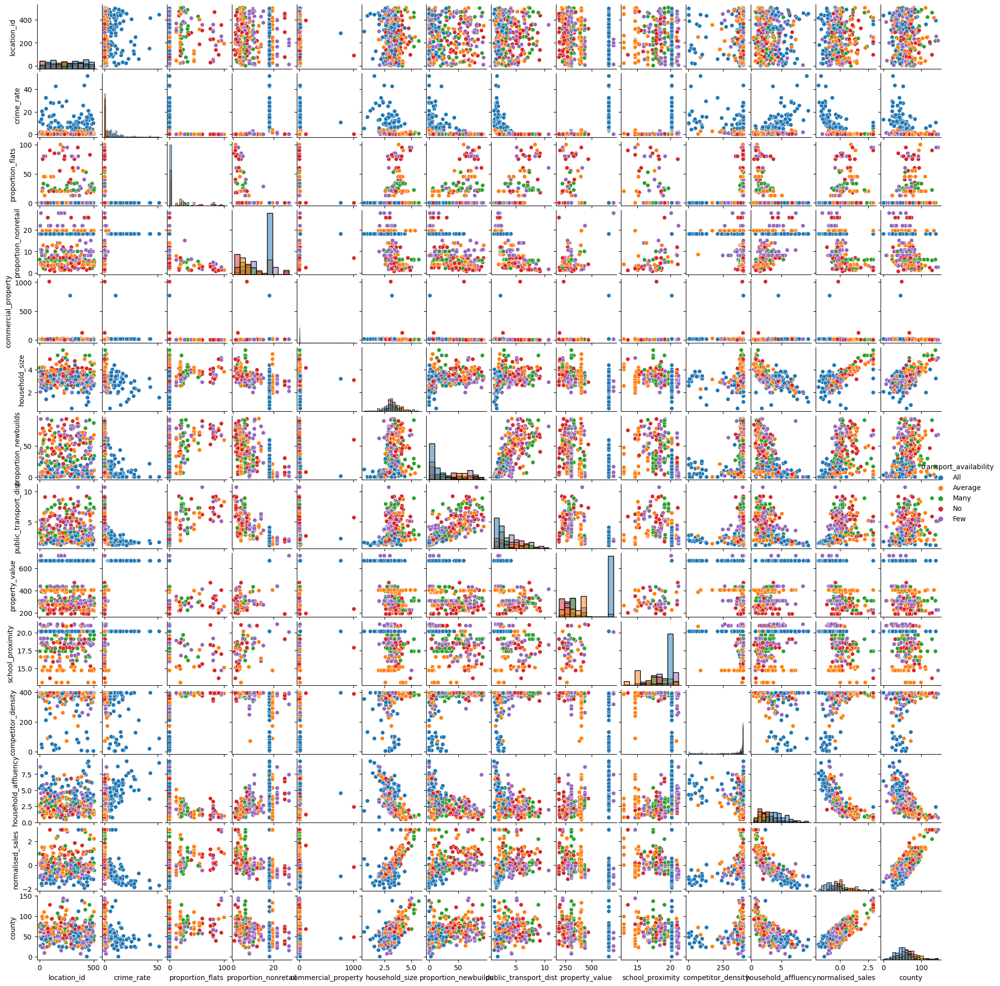

In [62]:
# plot histogram of continous features
print(train_describe_cols)
g = sns.pairplot(train[train_describe_cols + ["transport_availability"]], hue = "transport_availability", diag_kind="hist")
g.fig.set_size_inches(20,20)

# Quantile statistics for outlier detection

In [14]:
wo_cols = []
final, IQR_stats = outlier_IQR(train, train_describe_cols, wo_cols)
final_df = pd.DataFrame(final)
display(final_df)


,col,Q1,Q3,IQR,Q1-1.5*IQR,Q3+1.5*IQR,# below,# upper
0,location_id,126.500000,377.250000,250.750000,-249.625000,753.375000,0,0
1,crime_rate,0.087937,4.063553,3.975617,-5.875489,10.026979,0,41
2,proportion_flats,0.000000,12.500000,12.500000,-18.750000,31.250000,0,39
3,proportion_nonretail,5.130000,18.100000,12.970000,-14.325000,37.555000,0,0
4,commercial_property,5.450000,14.050000,8.600000,-7.450000,26.950000,0,3
5,household_size,2.879750,3.597250,0.717500,1.803500,4.673500,6,13
6,proportion_newbuilds,6.350000,54.450000,48.100000,-65.800000,126.600000,0,0
7,public_transport_dist,2.138075,5.116700,2.978625,-2.329862,9.584637,0,1
8,property_value,277.000000,666.000000,389.000000,-306.500000,1249.500000,0,0
9,school_proximity,17.400000,20.200000,2.800000,13.200000,24.400000,6,0


# In the following plots we looks for trend and outliers.

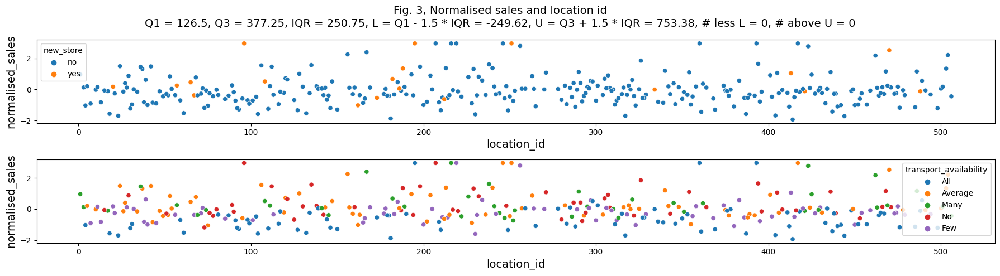

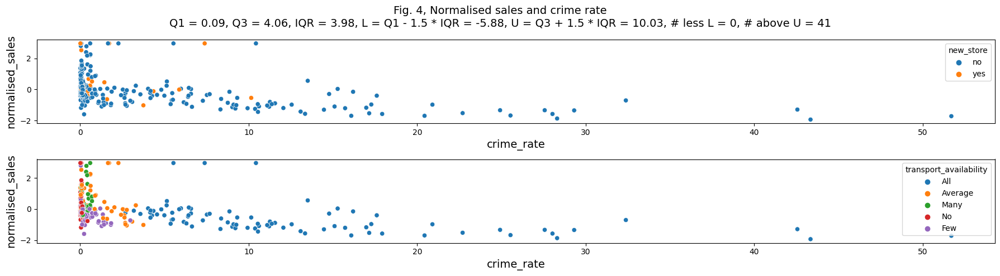

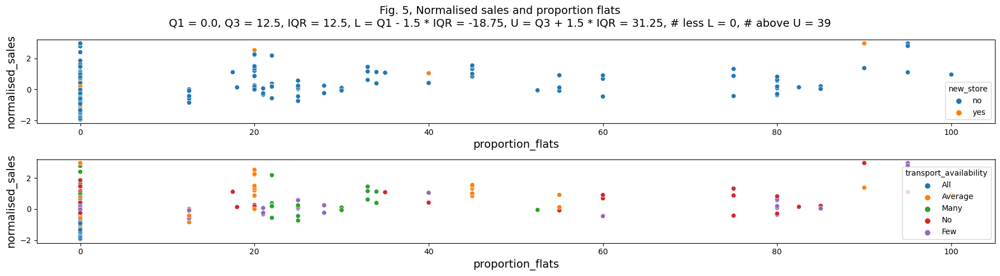

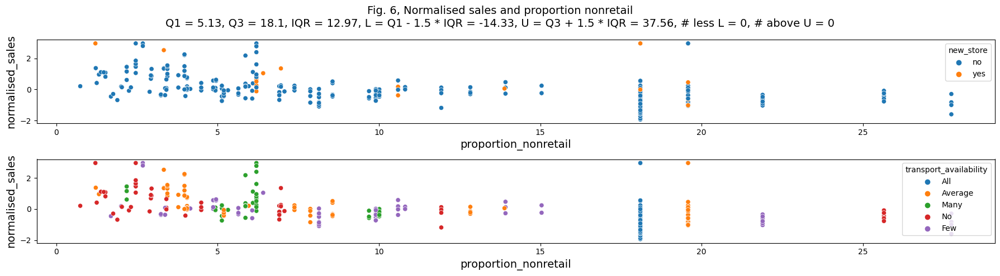

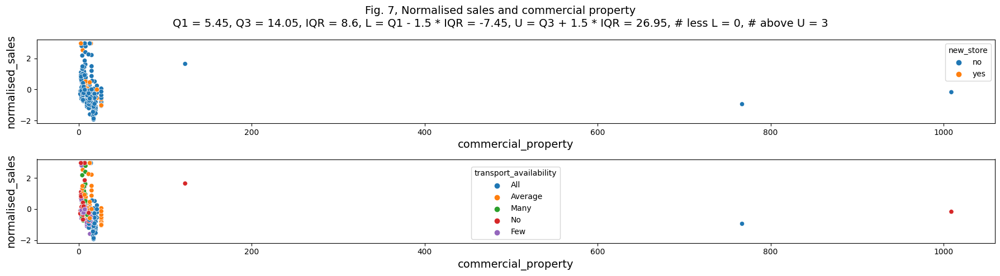

...

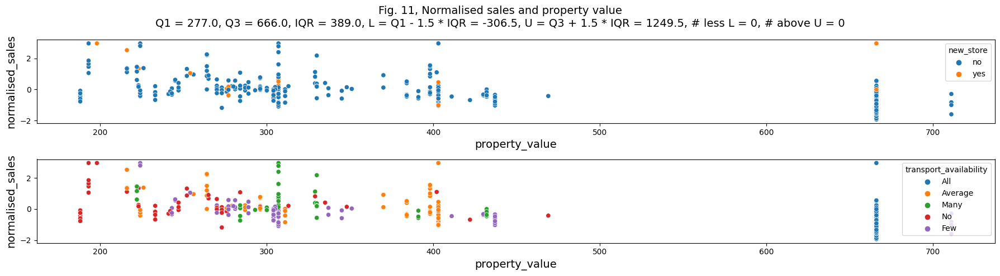

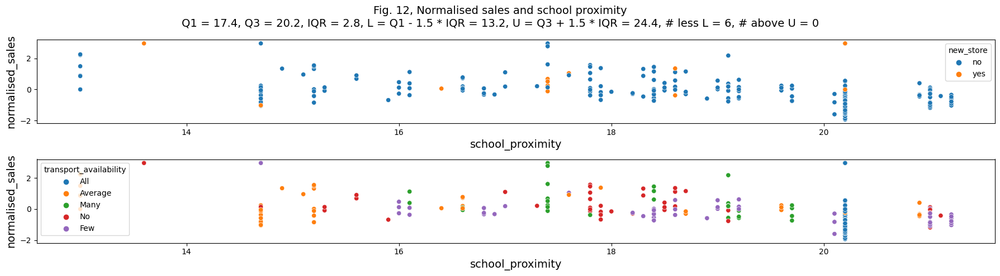

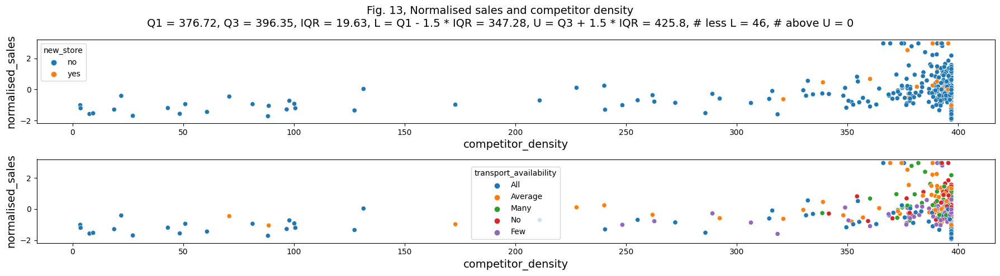

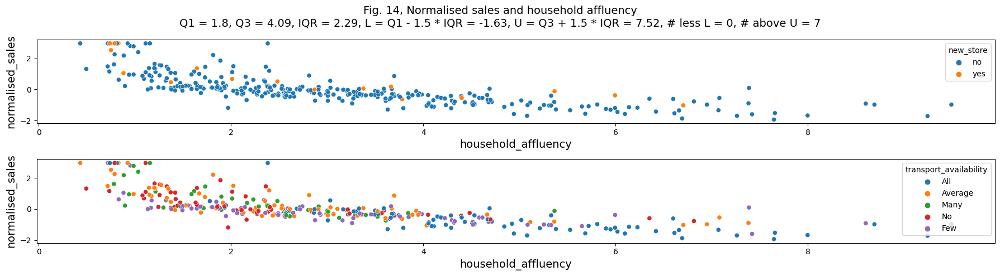

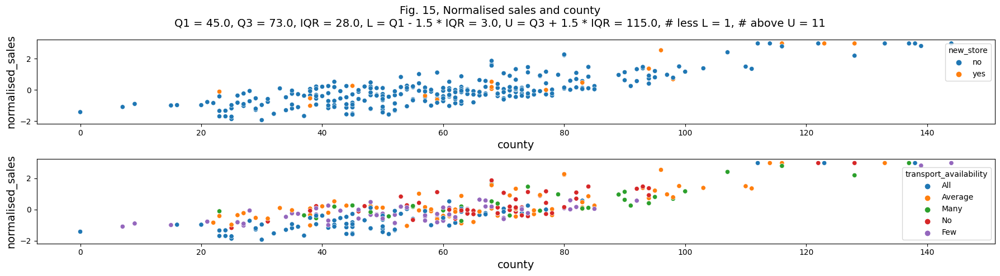

In [15]:
scatter_plot(train, train_describe_cols, IQR_stats)

# Remove outliers and perform imputation

In [16]:
sub_train, sub_train_describe_cols, imp = preprocessing(train, 
                                                        train_describe_cols)

print("Original size is ", len(train))
print("Size after cleaning: ", len(sub_train))

print("Columns with missing values: ", sub_train.columns[sub_train.isnull().any()])
missing = sub_train.isnull().sum()
print(missing)


sub_train_describe_cols:  ['crime_rate', 'proportion_flats', 'proportion_nonretail', 'commercial_property', 'household_size', 'proportion_newbuilds', 'public_transport_dist', 'property_value', 'school_proximity', 'competitor_density', 'household_affluency', 'county']
Original size is  320
Size after cleaning:  296
Columns with missing values:  Index([], dtype='object')
crime_rate                0
proportion_flats          0
proportion_nonretail      0
commercial_property       0
household_size            0
proportion_newbuilds      0
public_transport_dist     0
property_value            0
school_proximity          0
competitor_density        0
household_affluency       0
county                    0
transport_availability    0
new_store                 0
normalised_sales          0
dtype: int64


# Illustrate relation of normalised_sales and the corresponding features after removing missing values and outliers.

It seems we get more clear distribution relationship between features.

There is still something strange in proportion_nonretail - when its value is greater than around 17 it has horizontal lines.
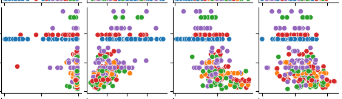


['crime_rate', 'proportion_flats', 'proportion_nonretail', 'commercial_property', 'household_size', 'proportion_newbuilds', 'public_transport_dist', 'property_value', 'school_proximity', 'competitor_density', 'household_affluency', 'normalised_sales', 'county']


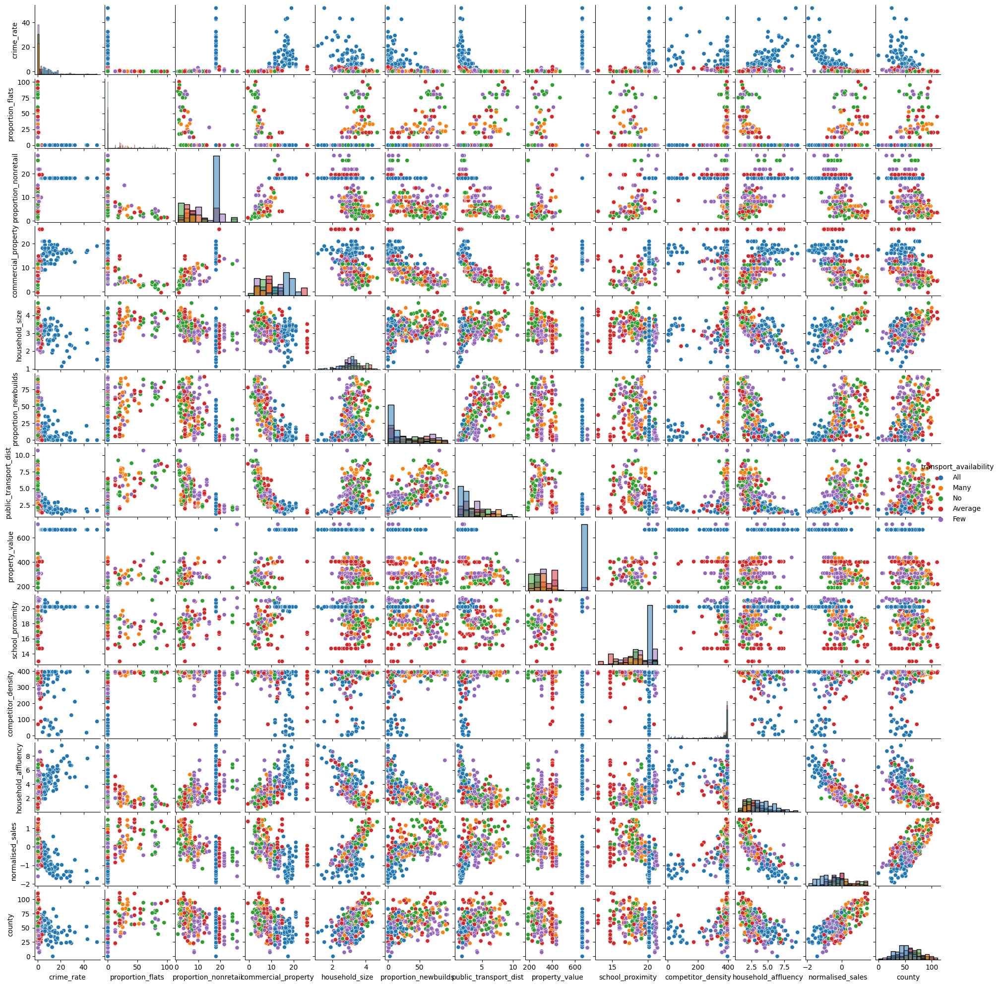

In [64]:
# plot histogram of continous features
pair_cols = [col  for col in train_describe_cols if col != 'location_id']
print(pair_cols)

g = sns.pairplot(sub_train[pair_cols + ["transport_availability"]], hue = "transport_availability", diag_kind="hist")
g.fig.set_size_inches(20,20)

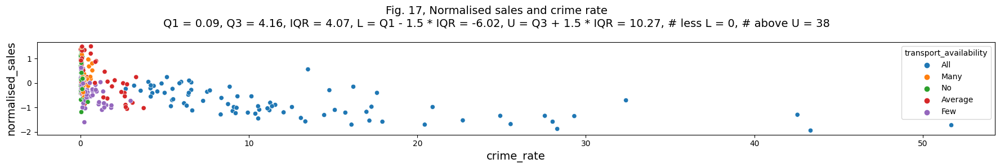

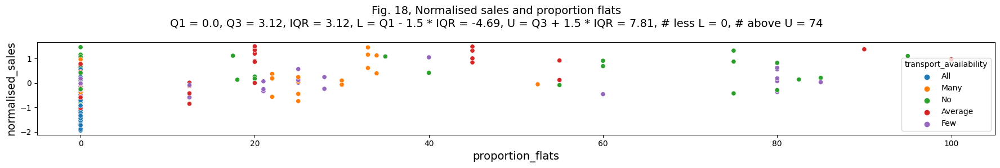

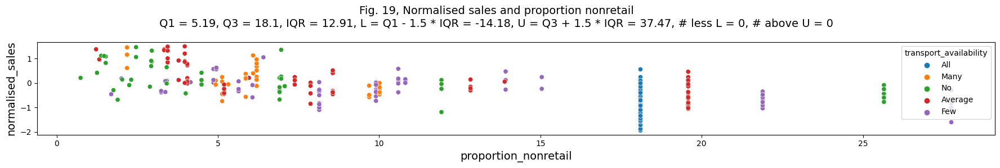

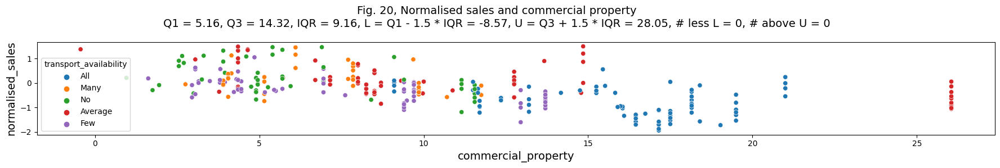

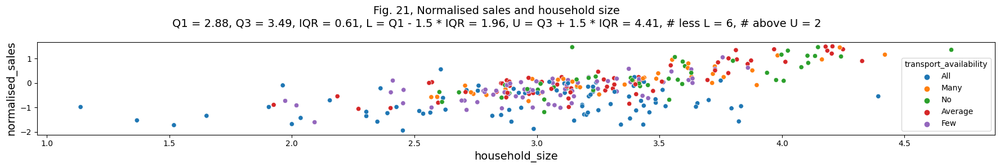

...

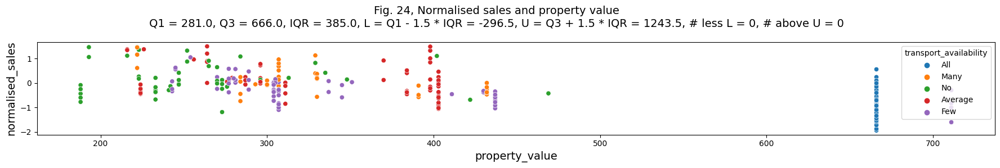

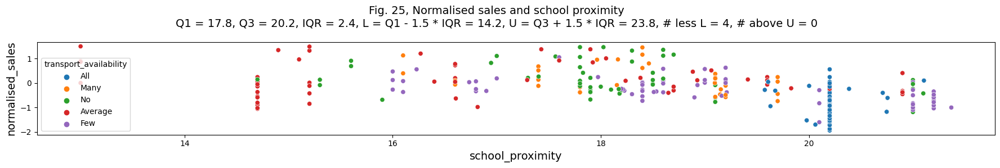

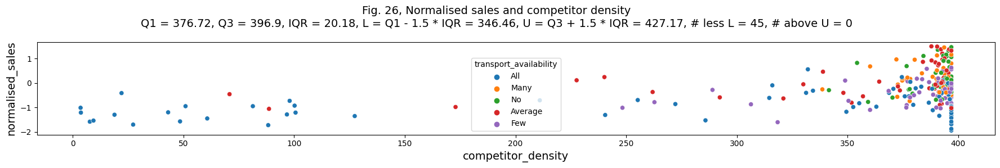

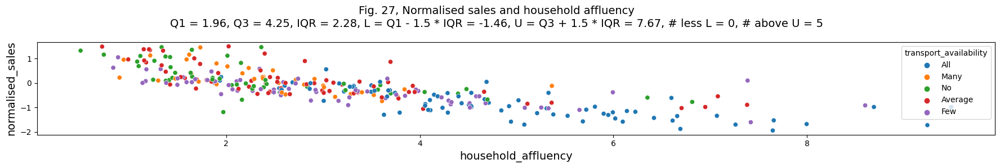

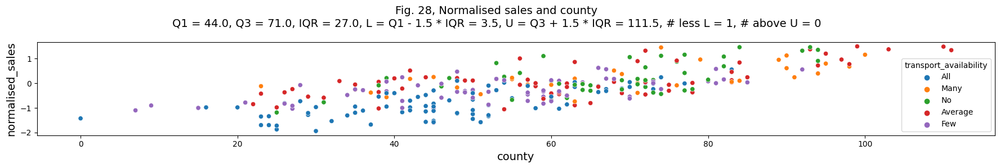

In [17]:
wo_cols = ["normalised_sales", "location_id", "transport_availability", "new_store"]
sub_final, sub_stats = outlier_IQR(sub_train, sub_train_describe_cols, wo_cols)
scatter_plot(sub_train, train_describe_cols, sub_stats, 17, wo_cols,  is_new_store = False, figsize=(18, 3))

In [18]:
new_store_no = sub_train[sub_train["new_store"] == "no" ]["normalised_sales"].values.copy()
new_store_yes= sub_train[sub_train["new_store"] == "yes"]["normalised_sales"].values.copy()

stats.ttest_ind(new_store_no, new_store_yes, permutations=10000, random_state=rng)

Ttest_indResult(statistic=-1.8146601445260746, pvalue=0.0704)

## Q2
Build a model that can predict store sales based on the provided area features. Please show how you developed the model and report how well your model is performing. ***Constraint:*** Please use Random Forest as the model family to solve this problem.







# Executive Summary for Q2

We perform outlier detection and imputation in Q1. 
Here converted both categorical variables **new_store** and **transport_availability** into numbers using one-hot-encoder. We also using ordering information of **transport_availability** and create features and put the different integer value to the corresponding values.

We use Bayesian Optimization (BO) for hyperparameter selection. 
I also use the Backward and Feedforward feature selections. Although Random Forest Regression performs implicit feature selection, Backward  improve a little bit Mean Absolute Error (MAE). BO only provide MAE = 0.20 and BO and Backward selection gives MAE equal to 0.196. Obviously, it is not significant difference and in practice we prefer just using BO. BO and Feedforward selection gives MAE around 0.21. Besides, in this case, Forward feature selection is more time consuming than Backward one.  

We choose Bayesiand Optimization because it is faster than grid search but more accurate than random search.

We perform diagnostics of prediction by looking at the residual distribution and pattern, and how prediction relate to the true values of normalised_sales.

It seems there is no pattern in the residuals. Residuals distributed accrding to bell like distribution.

WE use SHAP library to show feature importance.

In [19]:
def categorical_encoder(X_train, transport_options):
    """
    Transform category features into nominal ones.
    ________________
    Inputs:
    
    X_train is data frame with categorical features; 
    transport_options is the list of category levels.
    
    ________________
    Return:
    
    X_train is the dataframe where we convert categorical variables int one-hot-encoder columns or values.
    
    """
    encoder = OrdinalEncoder(categories=[transport_options])
    X_train["transport_availability_degree"] = encoder.fit_transform(X_train[["transport_availability"]])[:, 0]

    X_train = pd.get_dummies(X_train, columns=["transport_availability"], prefix=["transport_availability"])
    X_train["new_store"] = X_train["new_store"].apply(lambda x: 1 if x == "yes" else 0)
    
    return X_train

def objective(inputs):
    """
    Compute the objective function for Bayesian Optimization given hyperparameters
    ________________
    Inputs:
    
    inputs is dictionary of hyperparameters, training dataset and other settings.
    
    ________________
    Return:
    
    params is the dictionary
    
    """    
    params = inputs.copy()
    
    X_train = params["X_train"]
    n_splits = params["n_splits"]
    test_size = params["test_size"]
    random_state = params["random_state"]    
    metric_fun = params["metric_fun"]
    model = params["model"]
    
    ss = ShuffleSplit(n_splits=n_splits, test_size=test_size, random_state=random_state)
    
    output_label_name = params["output_label_name"]
    
    del params["X_train"], params["n_splits"], params["test_size"], params["random_state"], params["output_label_name"]   
    
    X = X_train.copy()
    y = X_train[[output_label_name]].copy()
    
    del params["metric_fun"], params["model"]
    del X[output_label_name]
    
    rf = RandomForestRegressor(**params)
    
    total = 0.0
    n = 0
    for train_index, test_index in ss.split(X):
        rf.fit(X.iloc[train_index], y.iloc[train_index])
        y_pred = rf.predict(X.iloc[test_index])
        y_test = y.iloc[test_index][output_label_name].values.copy()
        metric = metric_fun(y_test, y_pred)
         
        total += metric * len(y_test)
        n += len(y_test)
    
    loss = total / n
    
    params['loss'  ] = loss
    params['status'] = STATUS_OK
    #
    return params
        
def BO(MAX_EVALS, space, tpe_algorithm = tpe.suggest):
    """
    Main Bayesian Optimizationfunction
    ________________
    Inputs:
    
    MAX_EVALS is the number of iterations
    space is dict that contains the hyperparameters, training dataset and other settings. 
    tpe_algorith is the algorithm for surface optimization.
    
    ________________
    Return:
    
    bayes_trials_results[0] is the best hyperparameters that were found in Bayesian Optimization and
    the corresponding loss value.
    
    """ 
    
    bayes_trials = Trials()
    
     
      
    with warnings.catch_warnings():
                  warnings.simplefilter("ignore")
                  #
                  best = fmin(fn = objective, 
                              space = space, 
                              algo = tpe_algorithm, 
                              max_evals = MAX_EVALS, 
                              trials = bayes_trials,
                              rstate = np.random.seed(11))
                  bayes_trials_results = sorted(bayes_trials.results, key = lambda x: x['loss'])
                  #
    return bayes_trials_results[0]

def feature_importance_shap(cols, X_train, bayes_trials_results, X_test = None):
    """
    Compute feature importance using SHAP measures
    ________________
    Inputs:
    
    cols is the list of features;
    X_train is the training dataset;
    bayes_trials_results is the hyperparameters obtained by Bayesian Optimization
    X_test is the test dataset, if it is None we use split of training dataset into train/test.
    
    ________________
    Return:
    
    no output
    """

    X = X_train[cols].copy()
    y = X_train["normalised_sales"].copy()
    
    if X_test is None:
       X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
    else:
       X_train = X.copy() 
       y_train = y.copy()
        
    best_parameters = bayes_trials_results.copy()
    del best_parameters['loss'], best_parameters['status']


    model = RandomForestRegressor(**best_parameters)
    # Fits the model on the data
    model.fit(X_train, y_train)

    # Fits the explainer
    explainer = shap.Explainer(model.predict, X_test[cols])
    # Calculates the SHAP values - It takes some time
    shap_values = explainer(X_test[cols])
    shap.plots.bar(shap_values)
    shap.summary_plot(shap_values)

def RF_Regression_residual_plot(cols, X_train, bayes_trials_results):
    """
    Perform diagnostics of the regression model
    ________________
    Inputs:
    
    cols is list of features;
    X_train is the training dataset
    bayes_trials_results is the hyper parameters obtained by Bayesian Optimization. 
    ________________
    Return:
    
    no output
    """
    
    X = X_train[cols].values.copy()
    y = X_train["normalised_sales"].values.copy()

    best_parameters = bayes_trials_results.copy()
    del best_parameters['loss'], best_parameters['status']


    model = RandomForestRegressor(**best_parameters)
    # Fits the model on the data
    model.fit(X, y)
    
    pred = model.predict(X)
    residuals = y - pred
    residuals_df = pd.DataFrame({"residuals": residuals})
    sns.displot(residuals_df, x="residuals", kde=True)

    fig, ax1 = plt.subplots(figsize=(15, 5))#, sharey=True)
    fig.suptitle('Random Forest Residuals')
    x= range(len(residuals))
    plt.scatter(x, residuals)
    ax1.set_xlabel('# Observations')
    ax1.set_ylabel('Residuals')
    plt.show()
    
    fig, ax2 = plt.subplots(figsize=(15, 5))
    fig.suptitle('True Normalised Sales vs its Predictions')
    plt.scatter(pred,  y)

    ax2.set_xlabel('Predictions')
    ax2.set_ylabel('True Normalised Sales')
    
    plt.show()
    
def backward_feature_selection(MAX_EVALS, X_train, all_metric_min):
    """
    Perform Backward Feature Selection
    ________________
    Inputs:
    
    MAX_EVALS is the number of iteration in Bayesian Optimization
    X_train is the training dataset
    all_metric_min is the minimum metric.
    ________________
    Return:
    
    selected_cols is the selected features
    total_df is the data about feature selection on different stages 
    """
    cols = list(set(X_train.columns).difference(["normalised_sales", 
                                                 "transport_availability"]))
    print("Considered fetures: ", cols)

    metric_min = all_metric_min 
    isContinue = True

    selected_cols = cols
    total_df = pd.DataFrame()
    while isContinue:
          final = []  
          for col in selected_cols:
       
              print(col )
              candidate_selected_cols = list(set(selected_cols).difference([col]))
              sub_X_train = X_train[candidate_selected_cols  +  ["normalised_sales"]].copy()
    
              space["X_train"] =  hp.choice("X_train", [sub_X_train])
    
              n_features = len(candidate_selected_cols)
              max_depth = list(range(1, n_features + 1)) + [None] 
              max_features = list(range(1, n_features + 1)) + ["sqrt", "log2"]

              space["max_depth"] = hp.choice("max_depth", max_depth)
              space["max_features"] = hp.choice("max_features", max_features)    
    
              bayes_trials_results = BO(MAX_EVALS, space, tpe_algorithm = rand.suggest)
              bayes_trials_results["col"] = col
              bayes_trials_results["selected_cols"] = candidate_selected_cols
              bayes_trials_results["n_features"] = n_features
                    
              final.append(bayes_trials_results)  

          final_df = pd.DataFrame(final)

          final_df = final_df.sort_values(by = "loss")
         
          metric = final_df["loss"].values[0]
          if (metric_min >= metric) and (len(selected_cols) > 2):
              metric_min = metric  
              selected_cols = list(set(selected_cols).difference([final_df["col"].values[0]]))
              total_df = pd.concat([total_df, final_df.head(1)])
          else:
              isContinue = False
          print("-----------------------------------------------------") 
          print("Loss: ", metric_min, 
                ", Number of features: ", len(selected_cols), 
                ", Selected features: ", selected_cols)
          print("-----------------------------------------------------") 

    return selected_cols, total_df    

def forward_feature_selection(MAX_EVALS, X_train, all_metric_min):
    """
    Perform Feedforward Feature Selection
    ________________
    Inputs:
    
    MAX_EVALS is the number of iteration in Bayesian Optimization
    X_train is the training dataset
    all_metric_min is the minimum metric.
    ________________
    Return:
    
    selected_cols is the selected features
    total_df is the data about feature selection on different stages 
    """
    cols = list(set(X_train.columns).difference(["normalised_sales", 
                                                 "transport_availability"]))
    print("Considered fetures: ", cols)
    metric_min = all_metric_min
    isContinue = True

    selected_cols = []
    total_df = pd.DataFrame()
    while isContinue:
          final = []  
          for col in cols:
              if not(col in selected_cols): 
                 print(col )
                 candidate_selected_cols = selected_cols + [col]
                 sub_X_train = X_train[candidate_selected_cols  +  ["normalised_sales"]].copy()
    
                 space["X_train"] =  hp.choice("X_train", [sub_X_train])
    
                 n_features = len(candidate_selected_cols)
                 max_depth = list(range(1, n_features + 1)) + [None] 
                 max_features = list(range(1, n_features + 1)) + ["sqrt", "log2"]

                 space["max_depth"] = hp.choice("max_depth", max_depth)
                 space["max_features"] = hp.choice("max_features", max_features)    
    
                 bayes_trials_results = BO(MAX_EVALS, space, tpe_algorithm = rand.suggest)
                 bayes_trials_results["col"] = col
                 bayes_trials_results["selected_cols"] = candidate_selected_cols
                 bayes_trials_results["n_features"] = n_features
                 final.append(bayes_trials_results)  

          if len(final) > 0:
             final_df = pd.DataFrame(final)
             final_df = final_df.sort_values(by = "loss")       
             metric = final_df["loss"].values[0]
          if metric_min > metric:
             metric_min = metric  
             selected_cols.append(final_df["col"].values[0])
             total_df = pd.concat([total_df, final_df.head(1)])
          else:
             isContinue = False
          print("-----------------------------------------------------") 
          print("Loss: ", metric_min, 
                ", Number of features: ", len(selected_cols), 
                ", Selected features: ", selected_cols)
          print("-----------------------------------------------------") 

    return selected_cols, total_df


print("OK")

OK


In [20]:
transport_options

['No', 'Few', 'Average', 'Many', 'All']

In [21]:
X_train = sub_train.copy()
X_train = sub_train.copy()

X_train = categorical_encoder(X_train, transport_options)
X_train


,crime_rate,proportion_flats,proportion_nonretail,commercial_property,household_size,proportion_newbuilds,public_transport_dist,property_value,school_proximity,competitor_density,household_affluency,county,new_store,normalised_sales,transport_availability_degree,transport_availability_All,transport_availability_Average,transport_availability_Few,transport_availability_Many,transport_availability_No
0,17.600541,0.0,18.10,14.172775,2.926,29.0,2.9084,666.0,20.200000,368.74,4.5325,40.0,0,-0.399933,4.0,1,0,0,0,0
2,0.606810,0.0,6.20,7.700000,2.981,31.9,3.6715,307.0,17.400000,378.35,2.9125,53.0,0,0.166920,3.0,0,0,0,1,0
3,0.012385,55.0,2.25,1.950000,3.453,68.1,7.3073,300.0,15.300000,394.72,2.0575,65.0,0,-0.083804,0.0,0,0,0,0,1
4,0.016182,100.0,1.32,3.050000,3.816,59.5,8.3248,256.0,15.100000,392.90,0.9875,97.0,0,0.962693,2.0,0,1,0,0,0
5,0.068659,0.0,11.93,11.150000,3.976,9.0,2.1675,273.0,21.000000,396.90,1.4100,69.0,0,0.123316,0.0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314,6.306609,0.0,18.10,18.150000,3.436,12.1,2.3158,666.0,20.200000,100.19,4.0550,44.0,0,-0.923181,4.0,1,0,0,0,0
316,0.621579,20.0,3.97,14.850000,4.206,8.4,1.9301,264.0,13.000000,387.89,2.0250,99.0,0,1.496842,2.0,0,1,0,0,0
317,0.907062,0.0,8.14,5.447904,2.456,63.4,3.7965,307.0,21.000000,288.99,2.9225,36.0,0,-0.280022,1.0,0,0,1,0,0
318,0.105079,0.0,25.65,11.550000,2.961,7.1,2.0869,188.0,18.172869,378.09,4.4825,69.0,0,-0.247319,0.0,0,0,0,0,1


In [22]:
n_features = X_train.shape[1] - 1
max_depth = list(range(1, n_features + 1)) + [None] 
max_features = list(range(1, n_features + 1)) + ["sqrt", "log2"]

space = {"n_estimators":      hp.choice(  "n_estimators",      range(10,  100, 10)    ),
         "max_depth":         hp.choice(  "max_depth",         max_depth              ),
         "max_features":      hp.choice(  "max_features",      max_features           ),
         "min_samples_split": hp.choice(  "min_samples_split", range(2,  10)          ),
         "min_samples_leaf":  hp.choice(  "min_samples_leaf",  range(1,  10)          ),
         
         "model":             hp.choice(  "model",             [RandomForestRegressor]),
         "metric_fun":        hp.choice(  "metric_fun",        [mean_absolute_error]  ),
         "criterion":         hp.choice(  "criterion",         ["absolute_error"]     ),
         "n_jobs":            hp.choice(  'n_jobs',            [-1]                   ),             
         "random_state":      hp.choice(  "random_state",      [11]                   ),
              
         "X_train":           hp.choice(  "X_train",           [X_train]              ),
         "output_label_name": hp.choice(  "output_label_name", ["normalised_sales"]   ),
         "n_splits":          hp.choice(  "n_splits",          [5]                    ),
         "test_size":         hp.choice(  "test_size",         [0.2]                  )
        }

# Bayesian Optimization only.

In [23]:
MAX_EVALS = 30
start = time()
bayes_trials_results = BO(MAX_EVALS, space, tpe_algorithm = tpe.suggest)
end = time()
print("Execution time: ", end - start)
all_metric_min = bayes_trials_results['loss']
bayes_trials_results



100%|████████████████████████████████████████████████| 30/30 [00:53<00:00,  1.78s/trial, best loss: 0.1983512390932145]
Execution time:  53.37205529212952


{'criterion': 'absolute_error',
 'max_depth': 7,
 'max_features': 10,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 80,
 'n_jobs': -1,
 'loss': 0.1983512390932145,
 'status': 'ok'}

# Feature Importance for Bayesian Optimization only Model.

Permutation explainer: 61it [00:56,  1.09s/it]                                                                         


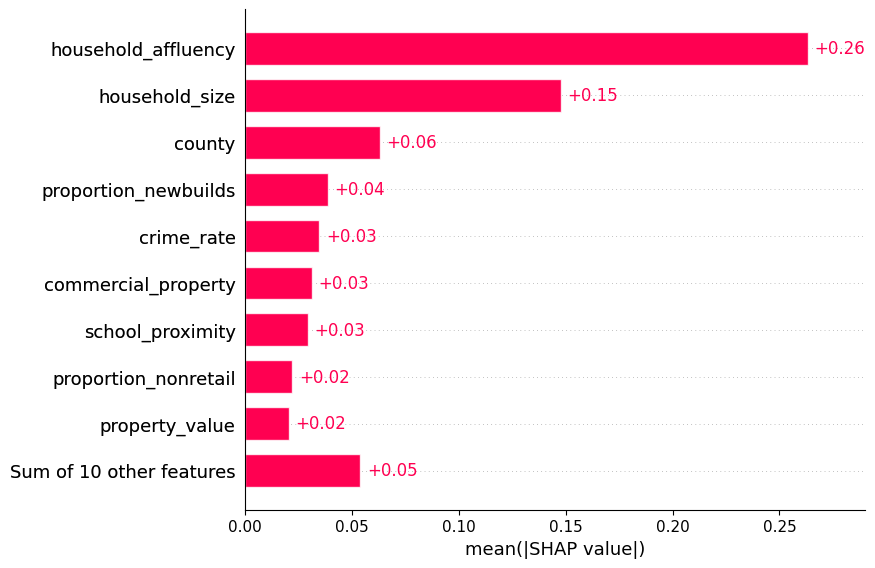

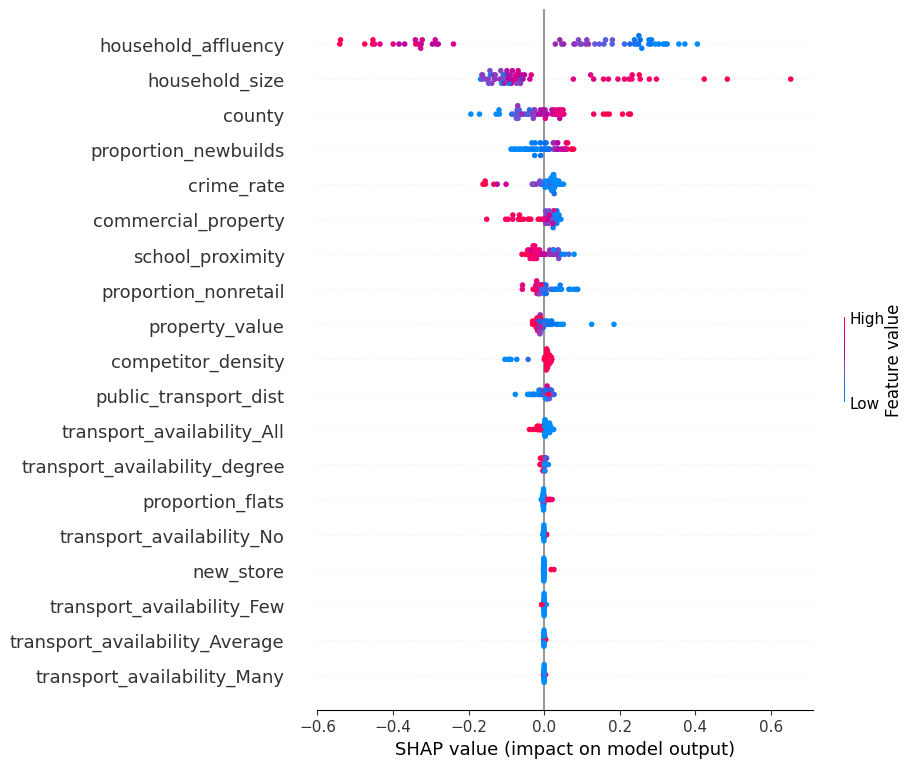

In [24]:
cols = list(set(X_train.columns).difference(["normalised_sales", 
                                             "transport_availability"]))
feature_importance_shap(cols, X_train, bayes_trials_results)

# Model Diagnostics for Bayesian Optimization only Model.

It seems there is no pattern in the residual variance, residual have bell shape distribution and there is linear relationship between true value and prediction of **normalised_sales**. It is what we should expect for the good model.

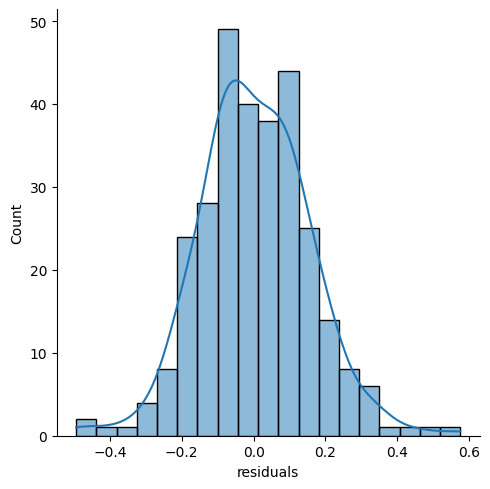

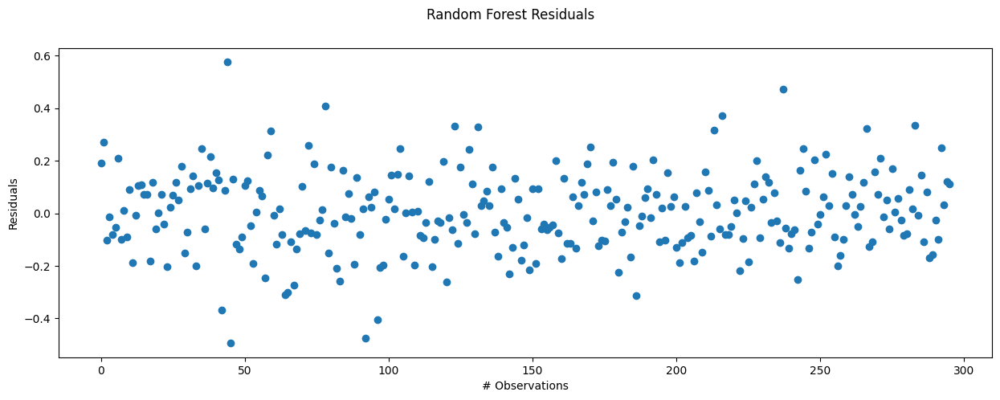

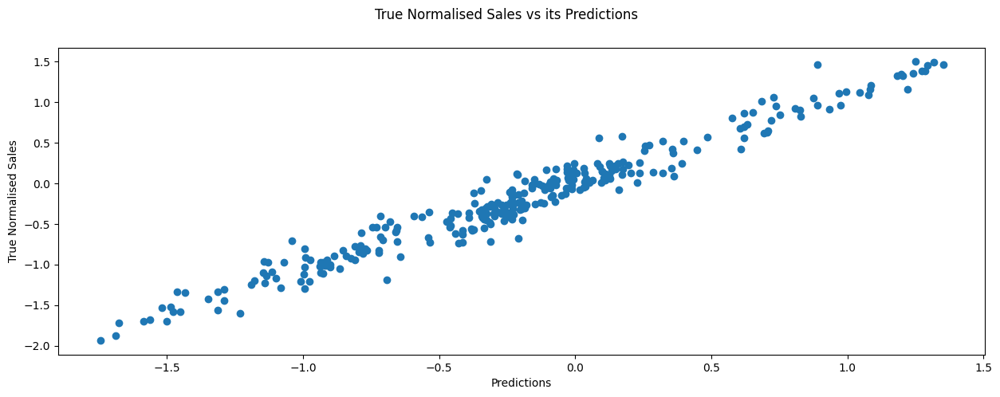

In [25]:
cols = list(set(X_train.columns).difference(["normalised_sales", 
                                             "transport_availability"]))
RF_Regression_residual_plot(cols, X_train, bayes_trials_results)

# Bayesian Optimization and Backward Feature Selection Model.

This method is faster than Feedforwad one for this dataset. But it is because in this case we do not have many non informative features to remove. The Backward method starts with all features and in every iteration select such a feature that: 1) has the lowest MAE between all other features after its removal from the selected features; 2) after removing this feature we obtain MAE lower than on the previous iterations. If we found the feature that satisfy these two constrains we remove it and repeat search of the next such a feature until we cannot find any.

In [26]:
MAX_EVALS  = 30
start = time()
backward_selected_cols, backward_total_df = backward_feature_selection(MAX_EVALS, X_train, all_metric_min)
end = time()
print("Execution time: ", end - start)
print("selected_cols obtained by backward selection: ", backward_selected_cols)

Considered fetures:  ['proportion_flats', 'transport_availability_Few', 'transport_availability_No', 'commercial_property', 'proportion_newbuilds', 'proportion_nonretail', 'school_proximity', 'household_size', 'transport_availability_All', 'transport_availability_Many', 'household_affluency', 'property_value', 'new_store', 'county', 'crime_rate', 'transport_availability_Average', 'transport_availability_degree', 'public_transport_dist', 'competitor_density']
proportion_flats
100%|███████████████████████████████████████████████| 30/30 [00:44<00:00,  1.50s/trial, best loss: 0.19386615778290872]
transport_availability_Few
100%|█████████████████████████████████████████████████| 30/30 [00:37<00:00,  1.24s/trial, best loss: 0.205809720300666]
transport_availability_No
100%|███████████████████████████████████████████████| 30/30 [00:41<00:00,  1.38s/trial, best loss: 0.20141449656146648]
commercial_property
100%|███████████████████████████████████████████████| 30/30 [00:47<00:00,  1.59s/trial,

100%|███████████████████████████████████████████████| 30/30 [00:43<00:00,  1.44s/trial, best loss: 0.20161041180495679]
new_store
100%|████████████████████████████████████████████████| 30/30 [00:35<00:00,  1.19s/trial, best loss: 0.2009705835058918]
county
100%|███████████████████████████████████████████████| 30/30 [00:57<00:00,  1.92s/trial, best loss: 0.20561721162052848]
crime_rate
100%|█████████████████████████████████████████████████| 30/30 [00:46<00:00,  1.54s/trial, best loss: 0.202067799711127]
transport_availability_Average
100%|███████████████████████████████████████████████| 30/30 [00:45<00:00,  1.51s/trial, best loss: 0.19622259120615715]
transport_availability_degree
100%|███████████████████████████████████████████████| 30/30 [00:39<00:00,  1.31s/trial, best loss: 0.20189951548149834]
public_transport_dist
100%|███████████████████████████████████████████████| 30/30 [00:48<00:00,  1.61s/trial, best loss: 0.20157339381652298]
competitor_density
100%|█████████████████████████

In [27]:
backward_total_df

,criterion,max_depth,max_features,min_samples_leaf,min_samples_split,n_estimators,n_jobs,loss,status,col,selected_cols,n_features
0,absolute_error,11.0,6,1,2,60,-1,0.193866,ok,proportion_flats,"[transport_availability_Few, transport_availab...",18
7,absolute_error,14.0,8,1,3,80,-1,0.193207,ok,transport_availability_All,"[transport_availability_Few, transport_availab...",17


In [28]:
tot = backward_total_df.tail(1)
backward_bayes_trials = {}
backward_bayes_trials["criterion"] = backward_total_df["criterion"].values[0]
backward_bayes_trials["max_depth"] = backward_total_df["max_depth"].values[0]
if math.isnan(backward_bayes_trials["max_depth"]):
   backward_bayes_trials["max_depth"] = None 
backward_bayes_trials["max_features"] = backward_total_df["max_features"].values[0]
backward_bayes_trials["min_samples_leaf"] = backward_total_df["min_samples_leaf"].values[0]
backward_bayes_trials["min_samples_split"] = backward_total_df["min_samples_split"].values[0]
backward_bayes_trials["n_estimators"] = backward_total_df["n_estimators"].values[0]
backward_bayes_trials["n_jobs"] = backward_total_df["n_jobs"].values[0]
backward_bayes_trials["loss"] = backward_total_df["loss"].values[0]
backward_bayes_trials["status"] = backward_total_df["status"].values[0]
backward_bayes_trials

{'criterion': 'absolute_error',
 'max_depth': 11.0,
 'max_features': 6,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 60,
 'n_jobs': -1,
 'loss': 0.19386615778290872,
 'status': 'ok'}

# Feature Importance for Bayesian Optimization and Backward Feature Selection Model.

Permutation explainer: 61it [00:46,  1.01it/s]                                                                         


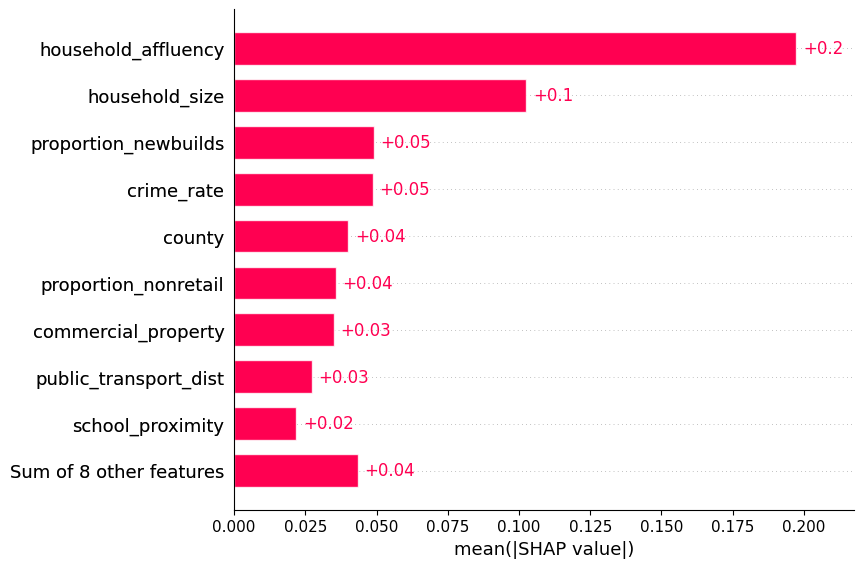

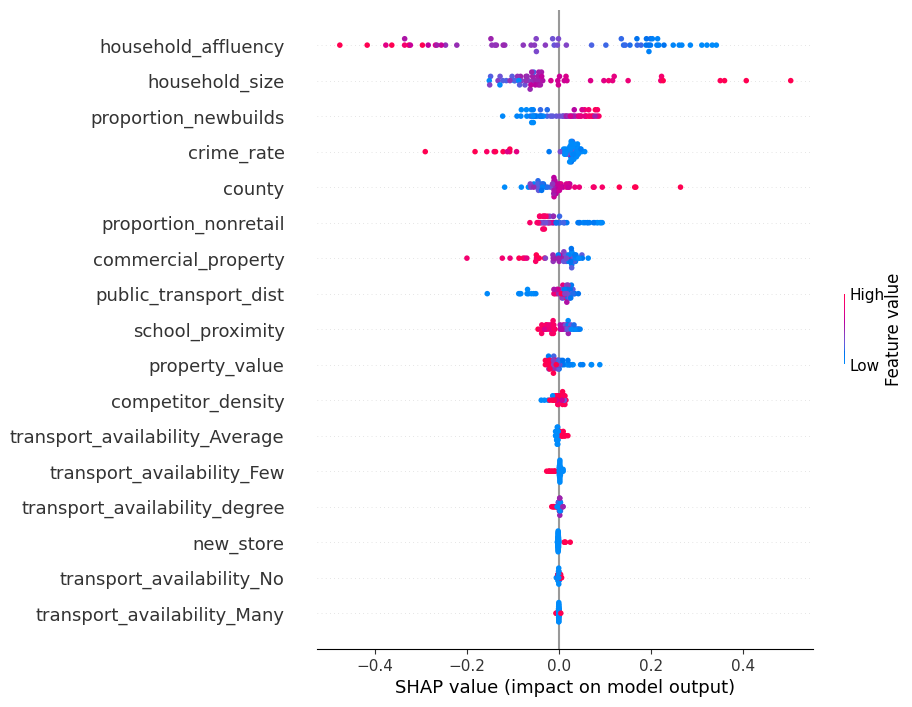

In [29]:
feature_importance_shap(backward_selected_cols, X_train, backward_bayes_trials)

# Model Diagnostics for Bayesian Optimization and Backward Feature Selection Model.

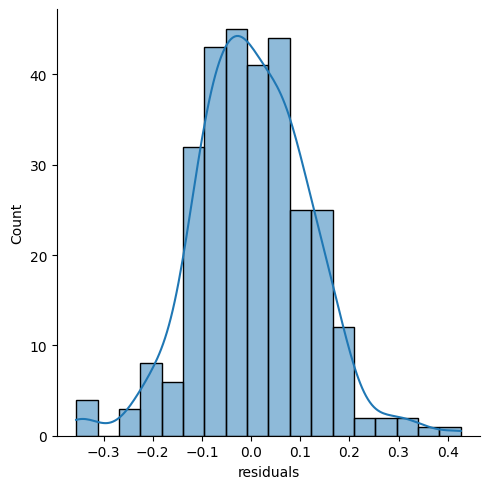

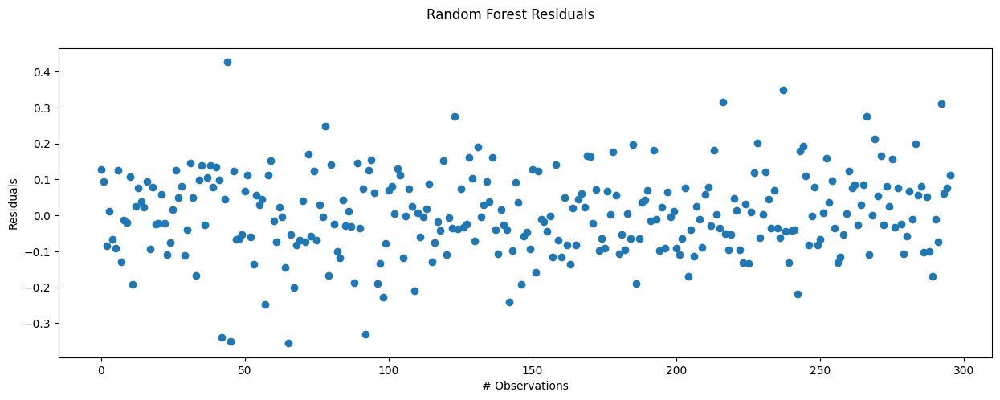

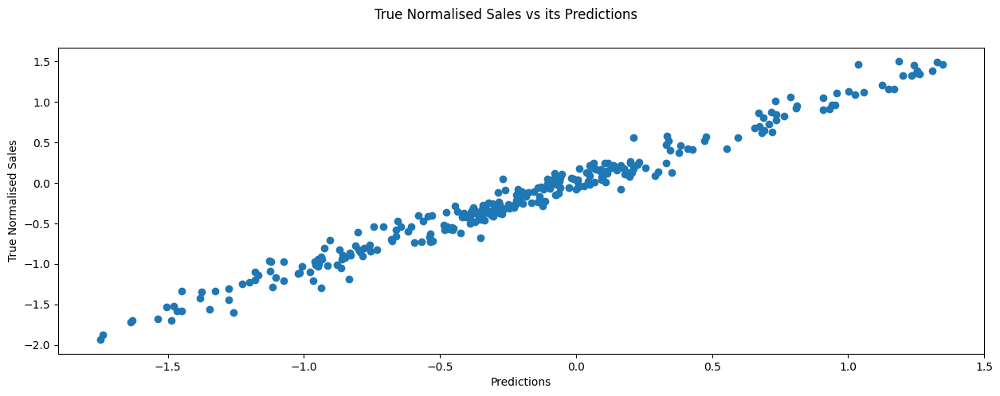

In [30]:
RF_Regression_residual_plot(backward_selected_cols, X_train, backward_bayes_trials)

# Feature Importance for Bayesian Optimization and Feedforward Feature Selection Algorithm.

you need change isExecute into isExecute = True if you want to run the followng cell but it takes much time and does not actually give the better results than the previous methods.

You can see the previous results when I run it.


The Feedforward Feature Selection Algorithm works as folowing:

1) at the beginning there is no selcted features;

2) on every iteration we are trying to find the feature that has not been selected yet that after adding this feature to the selected features we have the smallest MAE;

3) If this value MAE is smaller than before we add this feature to the selected features and search for another one;

3) we stop the search for another feature if at the end of the iteration we cannot find any feature 

Execution time:  **3752.08 seconds**.

selected_cols obtained by feedforward selection:  **['household_affluency', 'property_value', 'household_size', 'commercial_property', 'proportion_flats']**


In [31]:
isExecute = False

if isExecute:
   metric_min = 1000

   MAX_EVALS  = 30
   start = time()
   forward_selected_cols, forward_total_df = forward_feature_selection(MAX_EVALS, X_train, all_metric_min = metric_min)
   end = time()
   print("Execution time: ", end - start)
   print("selected_cols obtained by forward selection: ", forward_selected_cols)


Considered fetures:  ['proportion_flats', 'transport_availability_Few', 'transport_availability_No', 'commercial_property', 'proportion_newbuilds', 'proportion_nonretail', 'school_proximity', 'household_size', 'transport_availability_All', 'transport_availability_Many', 'household_affluency', 'property_value', 'new_store', 'county', 'crime_rate', 'transport_availability_Average', 'transport_availability_degree', 'public_transport_dist', 'competitor_density']
proportion_flats
100%|████████████████████████████████████████████████| 30/30 [00:32<00:00,  1.08s/trial, best loss: 0.4396390550232353]
transport_availability_Few
100%|████████████████████████████████████████████████| 30/30 [00:32<00:00,  1.09s/trial, best loss: 0.5362375841596414]
transport_availability_No
100%|████████████████████████████████████████████████| 30/30 [00:33<00:00,  1.11s/trial, best loss: 0.5388556416483855]
commercial_property
100%|███████████████████████████████████████████████| 30/30 [00:42<00:00,  1.42s/trial,

100%|████████████████████████████████████████████████| 30/30 [00:43<00:00,  1.44s/trial, best loss: 0.2456545507060698]
competitor_density
100%|███████████████████████████████████████████████| 30/30 [00:40<00:00,  1.36s/trial, best loss: 0.23873216163513974]
-----------------------------------------------------
Loss:  0.2320005905795721 , Number of features:  3 , Selected features:  ['household_affluency', 'property_value', 'household_size']
-----------------------------------------------------
proportion_flats
100%|███████████████████████████████████████████████| 30/30 [00:40<00:00,  1.36s/trial, best loss: 0.22957920534839688]
transport_availability_Few
100%|████████████████████████████████████████████████| 30/30 [00:36<00:00,  1.22s/trial, best loss: 0.2219831746828998]
transport_availability_No
100%|███████████████████████████████████████████████| 30/30 [00:33<00:00,  1.10s/trial, best loss: 0.22625667055829235]
commercial_property
100%|█████████████████████████████████████████████

## Q3
The dataset contains a test set of potential store locations. Use your developed model to predict the sales value in these areas and explain what recommendations you would give to the Stores Team to use it. Use any tools that may help you to share your findings with product owners and other non-technical decision makers in the team. Complete this task by explaining how you would improve the current results.

# Executive Summary Q3

The 5 most important features for predicting **normalised sales** are the following (see the following Fig):

- household_affluency;
- household_size;
- county;
- proportion_newbuilds; 
- crime_rate.

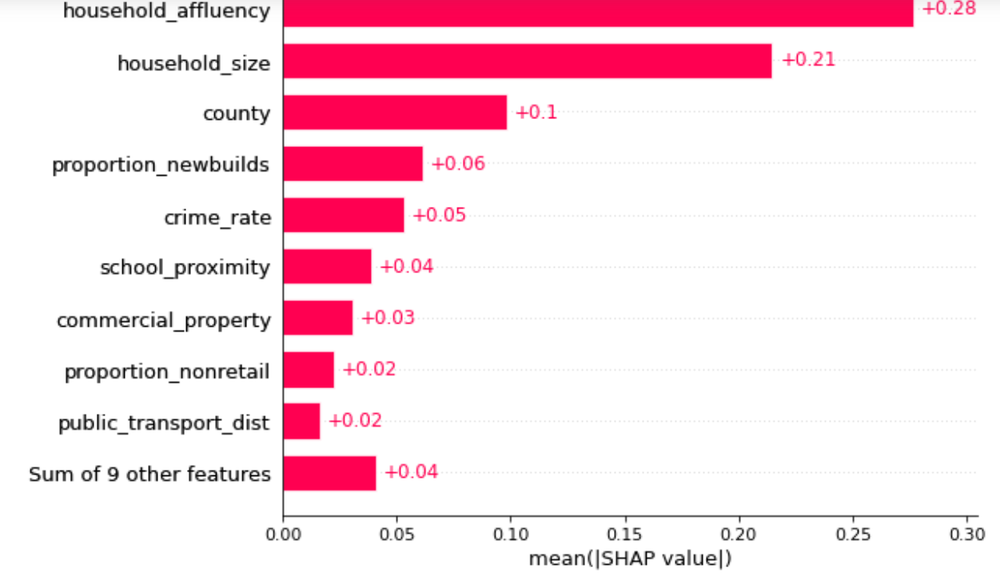


There is clear trend between **household_size** and **normalised sale** - the larger **household_size** the larger is **normalised sale**.


Point estimate might not be good measure because the variance of the prediction might be large for higher values of **normalised sale** but lower for lower values of **normalised sale**. 

We can use, for example, the Python code provided in the following [blog](https://saattrupdan.github.io/2020-03-01-bootstrap-prediction/) to compute predictive interval. 

We also need need a utility function of running the stores in the certain area.
For example, we might have large sales in dangerous neighborhood but maybe we have extra cost running stores there.

If we only care about the **normalised sale** values then we recommend to make stores at county 140, 122 and 69 where we have normalised sales 1.199, 1.111 and 0.821. In order to make the more reliable decision we need to perfrom bootstrap to estimate prediction interval of **normalised sale** and find average utility based on the bootstrap samples.   

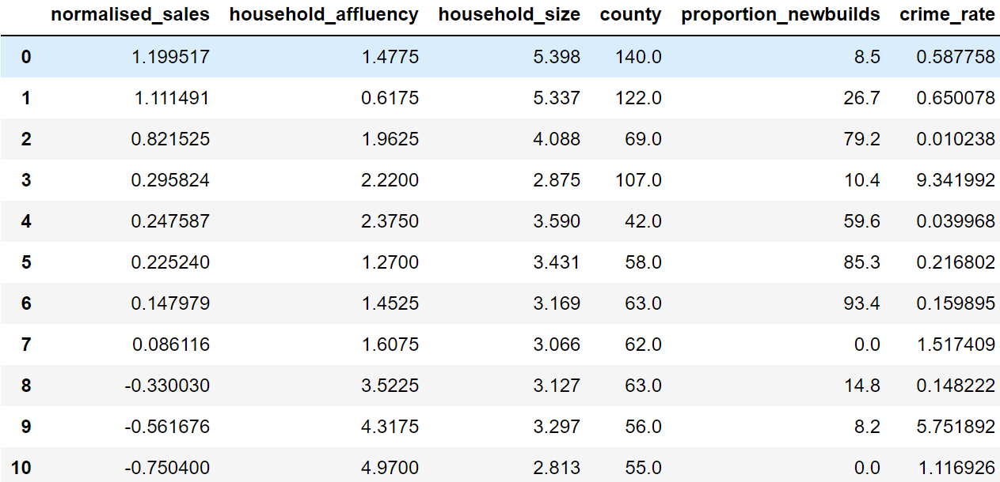

In order to improve the result of prediction we might try xgboost regression (see XGBRegressor in the following dictionary). We actually can use the Bayesian Optimization code above but we need to change the dictionary below, for example, we need to replace or remove "criterion" in the following dictionary. Besides, we can use clustering or manifol mapping to create the new features and PCA to remove some correlation between features. PCA remove correltion but it does not garantee to improve the perfromance.

```python
xgb_space = {"scale_pos_weight": hp.choice("scale_pos_weight",[scale_pos_weight]),
"use_label_encoder": hp.choice("use_label_encoder",[False]),
'max_depth': hp.choice('max_depth', range(5, 100)),
'learning_rate': hp.quniform('learning_rate',0.001, 0.5, 0.001),
'n_estimators': hp.choice('n_estimators',range(20, 500, 5  )),
'gamma': hp.quniform('gamma', 0, 10.0, 0.01),
'min_child_weight': hp.quniform('min_child_weight', 1, 30, 1),
'subsample': hp.quniform('subsample', 0.1, 1, 0.01),
'colsample_bytree': hp.quniform('colsample_bytree', 0.1, 1.0, 0.01),
'eval_metric': hp.choice('eval_metric', ['mlogloss']),
'n_jobs': hp.choice('n_jobs', [-1]),
"model": hp.choice("model", [XGBRegressor]),
"metric_fun": hp.choice("metric_fun",[mean_absolute_error]  ),
"criterion": hp.choice("criterion", ["absolute_error"]),
"n_jobs":hp.choice('n_jobs',[-1]),             
"random_state": hp.choice("random_state",[11]),
"X_train":hp.choice("X_train",[X_train]),
"output_label_name": hp.choice("output_label_name", ["normalised_sales"]),
"n_splits": hp.choice("n_splits",[5]),
"test_size": hp.choice("test_size",[0.2])  
}
```


In [32]:
path = "data/tesco-dataset"
test_name = "test.csv"

path_test_name = os.path.join(path, test_name)
test = pd.read_csv(path_test_name)
test

,location_id,crime_rate,proportion_flats,proportion_nonretail,new_store,commercial_property,household_size,proportion_newbuilds,public_transport_dist,transport_availability,property_value,school_proximity,competitor_density,household_affluency,county
0,105,0.039968,34.0,6.09,no,4.15,3.590,59.6,5.4917,Many transport options,329,16.1,395.75,2.3750,c_42
1,400,0.587758,20.0,3.97,no,14.85,5.398,8.5,2.2885,Average transport options,264,13.0,386.86,1.4775,c_140
2,338,1.116926,0.0,8.14,no,9.40,2.813,0.0,4.0952,Few transport options,307,NaN,394.54,4.9700,c_55
3,227,1.517409,0.0,19.58,no,12.75,3.066,0.0,1.7573,Average transport options,403,14.7,353.89,1.6075,c_62
4,114,83.093533,0.0,18.10,no,16.45,2.957,0.0,1.8026,All transport options,666,20.2,16.45,5.1550,c_22
5,203,10.988323,0.0,18.10,no,19.50,3.406,2.8,2.0651,All transport options,666,20.2,385.96,4.8800,c_19
6,12,0.159895,0.0,6.91,no,4.90,3.169,93.4,5.7209,No transport options,233,17.9,383.37,1.4525,c_63
7,199,9.341992,0.0,18.10,yes,15.90,2.875,10.4,1.1296,All transport options,666,20.2,347.88,2.2200,c_107
8,477,0.010238,90.0,2.97,no,2.50,4.088,79.2,7.3073,No transport options,285,15.3,394.72,1.9625,c_69
9,341,0.216802,0.0,7.38,no,7.15,3.431,85.3,5.4159,Average transport options,287,19.6,393.68,1.2700,c_58


# Find features that have missing values.

It seems we have the same features with missing values as in the training dataset, therefore, we can perform the same preprocessing.

In [33]:
print("Columns with missing values: ", test.columns[test.isnull().any()])
missing = test.isnull().sum()
print(missing)



Columns with missing values:  Index(['commercial_property', 'school_proximity'], dtype='object')
location_id               0
crime_rate                0
proportion_flats          0
proportion_nonretail      0
new_store                 0
commercial_property       1
household_size            0
proportion_newbuilds      0
public_transport_dist     0
transport_availability    0
property_value            0
school_proximity          2
competitor_density        0
household_affluency       0
county                    0
dtype: int64


In [34]:
test["county"] = test["county"].apply(lambda x: int(x.replace("c_", "")) )

test["transport_availability"] = test["transport_availability"].apply(lambda x: x.replace(" transport options", ""))
print("transport_availability: ", test["transport_availability"].unique())
print(test["transport_availability"].value_counts())

sub_train_describe_cols = [col for col in train_describe_cols if not((col == "location_id") or (col == "transport_availability"))]

X_test, imp = imputation(test, sub_train_describe_cols, imp = imp)
X_test = categorical_encoder(X_test, transport_options)


transport_availability:  ['Many' 'Average' 'Few' 'All' 'No']
Average    4
All        4
Many       2
No         2
Few        1
Name: transport_availability, dtype: int64
sub_train_describe_cols:  ['crime_rate', 'proportion_flats', 'proportion_nonretail', 'commercial_property', 'household_size', 'proportion_newbuilds', 'public_transport_dist', 'property_value', 'school_proximity', 'competitor_density', 'household_affluency', 'county']


In [35]:
X_test

,crime_rate,proportion_flats,proportion_nonretail,commercial_property,household_size,proportion_newbuilds,public_transport_dist,property_value,school_proximity,competitor_density,household_affluency,county,new_store,transport_availability_degree,transport_availability_All,transport_availability_Average,transport_availability_Few,transport_availability_Many,transport_availability_No
0,0.039968,34.0,6.09,4.150000,3.590,59.6,5.4917,329.0,16.100000,395.75,2.3750,42.0,0,3.0,0,0,0,1,0
1,0.587758,20.0,3.97,14.850000,5.398,8.5,2.2885,264.0,13.000000,386.86,1.4775,140.0,0,2.0,0,1,0,0,0
2,1.116926,0.0,8.14,9.400000,2.813,0.0,4.0952,307.0,18.635227,394.54,4.9700,55.0,0,1.0,0,0,1,0,0
3,1.517409,0.0,19.58,12.750000,3.066,0.0,1.7573,403.0,14.700000,353.89,1.6075,62.0,0,2.0,0,1,0,0,0
4,83.093533,0.0,18.10,16.450000,2.957,0.0,1.8026,666.0,20.200000,16.45,5.1550,22.0,0,4.0,1,0,0,0,0
5,10.988323,0.0,18.10,19.500000,3.406,2.8,2.0651,666.0,20.200000,385.96,4.8800,19.0,0,4.0,1,0,0,0,0
6,0.159895,0.0,6.91,4.900000,3.169,93.4,5.7209,233.0,17.900000,383.37,1.4525,63.0,0,0.0,0,0,0,0,1
7,9.341992,0.0,18.10,15.900000,2.875,10.4,1.1296,666.0,20.200000,347.88,2.2200,107.0,1,4.0,1,0,0,0,0
8,0.010238,90.0,2.97,2.500000,4.088,79.2,7.3073,285.0,15.300000,394.72,1.9625,69.0,0,0.0,0,0,0,0,1
9,0.216802,0.0,7.38,7.150000,3.431,85.3,5.4159,287.0,19.600000,393.68,1.2700,58.0,0,2.0,0,1,0,0,0


In [36]:
def rf_prediction(cols, X_train, X_test, bayes_trials_results):
    """
    Perform prediction for X_test by Random Forest Regression model
    obtained using X_train, cols and bayes_trials_results.
    """

    X = X_train[cols].values.copy()
    y = X_train["normalised_sales"].values.copy()

    best_parameters = bayes_trials_results.copy()
    del best_parameters['loss'], best_parameters['status']

    model = RandomForestRegressor(**best_parameters)
    # Fits the model on the data
    model.fit(X, y)
    
    X_t = X_test[cols].values.copy()
    pred = model.predict(X_t)
    X_test["normalised_sales"] = pd.Series(pred, index = X_test.index)
    
    return X_test

In [37]:
pred_X_test = rf_prediction(backward_selected_cols, 
                       X_train, 
                       X_test, 
                       backward_bayes_trials)

pred_X_test.sort_values(by = "normalised_sales", ascending = False)

,crime_rate,proportion_flats,proportion_nonretail,commercial_property,household_size,proportion_newbuilds,public_transport_dist,property_value,school_proximity,competitor_density,household_affluency,county,new_store,transport_availability_degree,transport_availability_All,transport_availability_Average,transport_availability_Few,transport_availability_Many,transport_availability_No,normalised_sales
1,0.587758,20.0,3.97,14.850000,5.398,8.5,2.2885,264.0,13.000000,386.86,1.4775,140.0,0,2.0,0,1,0,0,0,1.249571
11,0.650078,0.0,6.20,7.850000,5.337,26.7,3.8384,307.0,17.400000,385.91,0.6175,122.0,0,3.0,0,0,0,1,0,1.070249
8,0.010238,90.0,2.97,2.500000,4.088,79.2,7.3073,285.0,15.300000,394.72,1.9625,69.0,0,0.0,0,0,0,0,1,0.661371
0,0.039968,34.0,6.09,4.150000,3.590,59.6,5.4917,329.0,16.100000,395.75,2.3750,42.0,0,3.0,0,0,0,1,0,0.273386
9,0.216802,0.0,7.38,7.150000,3.431,85.3,5.4159,287.0,19.600000,393.68,1.2700,58.0,0,2.0,0,1,0,0,0,0.208162
6,0.159895,0.0,6.91,4.900000,3.169,93.4,5.7209,233.0,17.900000,383.37,1.4525,63.0,0,0.0,0,0,0,0,1,0.190357
7,9.341992,0.0,18.10,15.900000,2.875,10.4,1.1296,666.0,20.200000,347.88,2.2200,107.0,1,4.0,1,0,0,0,0,0.173824
3,1.517409,0.0,19.58,12.750000,3.066,0.0,1.7573,403.0,14.700000,353.89,1.6075,62.0,0,2.0,0,1,0,0,0,0.024752
12,0.148222,0.0,8.56,10.063376,3.127,14.8,2.1224,384.0,20.900000,387.69,3.5225,63.0,0,2.0,0,1,0,0,0,-0.345337
10,5.751892,0.0,18.10,18.150000,3.297,8.2,2.3682,666.0,19.590920,385.09,4.3175,56.0,0,4.0,1,0,0,0,0,-0.555726


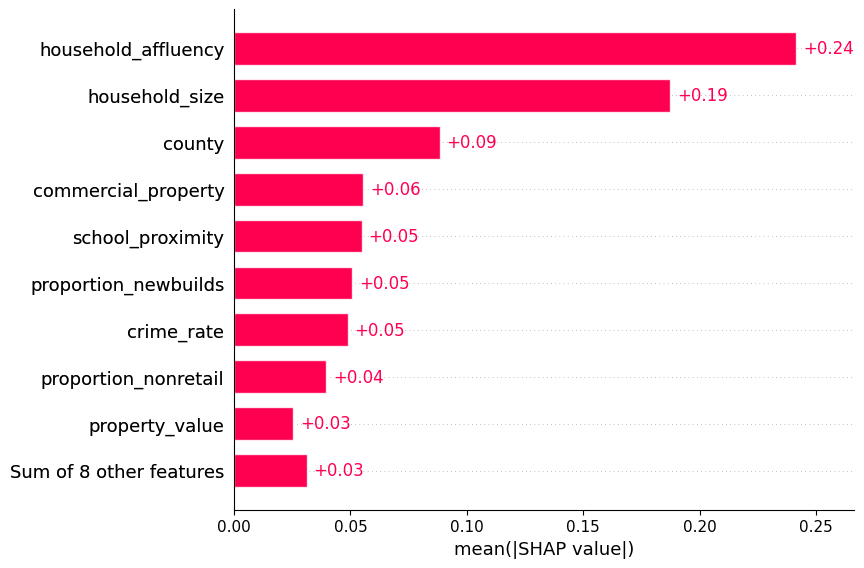

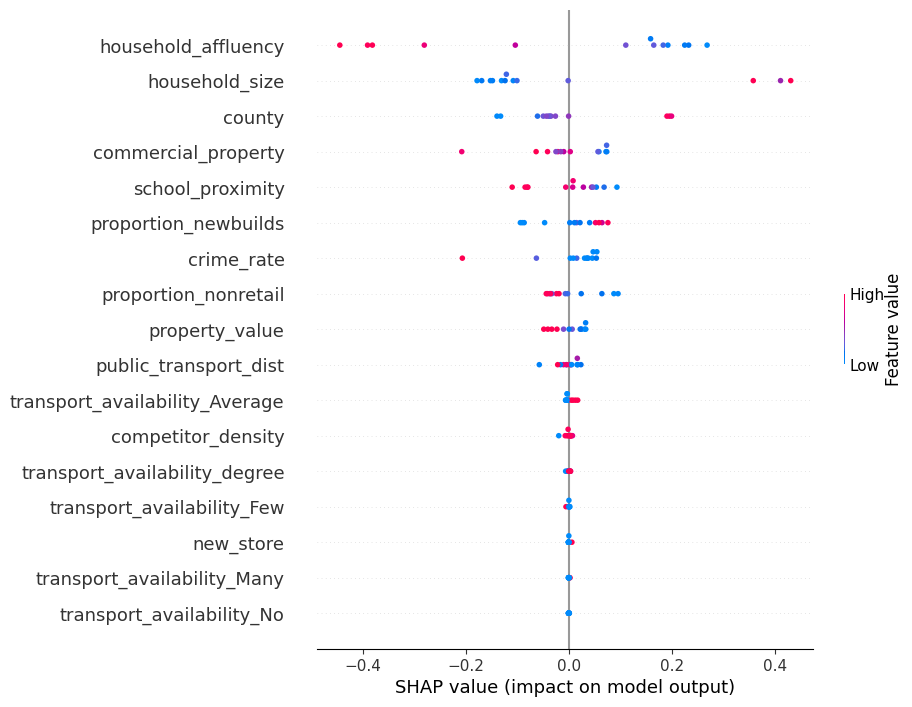

In [38]:
feature_importance_shap(backward_selected_cols, X_train, backward_bayes_trials, pred_X_test)

In [83]:
pred_X_test.sort_values(by = "normalised_sales", ascending = False, inplace = True)
cc = ["normalised_sales","household_affluency",
"household_size",
"county",
"proportion_newbuilds",
"crime_rate"]

pred_X_test = pred_X_test.reset_index()
pred_X_test.to_csv("pred_X_test.csv")
pred_X_test[cc]

,normalised_sales,household_affluency,household_size,county,proportion_newbuilds,crime_rate
0,1.249571,1.4775,5.398,140.0,8.5,0.587758
1,1.070249,0.6175,5.337,122.0,26.7,0.650078
2,0.661371,1.9625,4.088,69.0,79.2,0.010238
3,0.273386,2.3750,3.590,42.0,59.6,0.039968
4,0.208162,1.2700,3.431,58.0,85.3,0.216802
5,0.190357,1.4525,3.169,63.0,93.4,0.159895
6,0.173824,2.2200,2.875,107.0,10.4,9.341992
7,0.024752,1.6075,3.066,62.0,0.0,1.517409
8,-0.345337,3.5225,3.127,63.0,14.8,0.148222
9,-0.555726,4.3175,3.297,56.0,8.2,5.751892


## -------------

## Masked Dataset

You are given the following small dataset, which has been completely masked for privacy reasons. Please train the best model you can come up with to predict the target variable `y` based on the features `x1` and `x2`. Explain every step you take. 

Assuming that this model will be used for making decisions involving important sums of money, provide any comments that you think you should be giving to the business as a technical expert.

Dataset files
* `masked_dataset/train.csv`

First we perform explanatory analysis. We analyse x1, x2 and y distributions, it seems x1 ressemble y distribution - it has the same peaks. There is linear relationship between x1, x2 from one side and y from other side.
The features x1 and x2 almost non correlated (correlation is 6%).

First we perform feature selction using x1, x2 and their interaction using Akaike criteria (AIC) and linear regression. this approach for feature selection is quite common in statistics in Machine Learning people prefer perfrom cross validation.

The best model using AIC (lowest values are the best) is $y=intercept + \beta_1 * x_1 + \beta_2 * x_2$ where $intercept$, $\beta_1$ and $\beta_2$ are parameter of linear regression model.
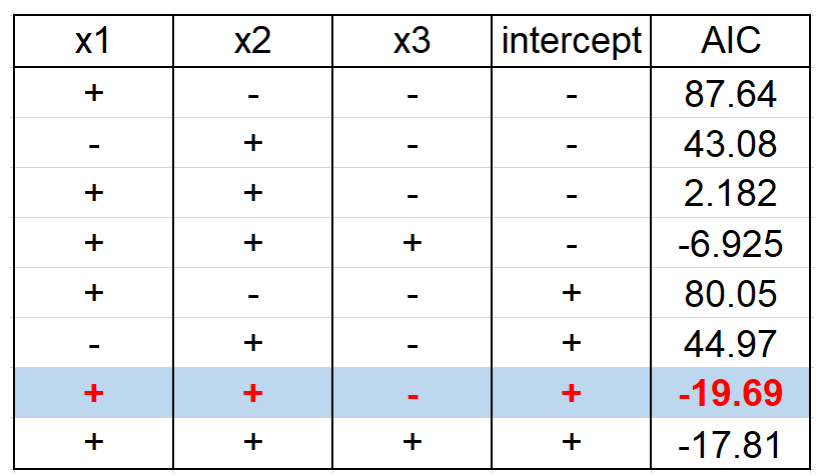

We analyse residuals of the model, residuals have bell shape distribution and no patterns. It seem the variance does no change.  Note that, in order to estimate parameter of linear regression model we can use maximum likelihood or least square approach. If we assum that additive noise is Gaussian then both approaches give the same estimate of the parameter of the model. But strictly speaking it is not requirmente that noise has to be normally distributed.


**RE: Assuming that this model will be used for making decisions involving important sums of money, provide any comments that you think you should be giving to the business as a technical expert.**

When we deal will with decision that use important sum of money then we cannot use point estimate anymore and we should use Bayesian approach or at least prediction confidence interval. In this Bayesian approach instead of one prediction we have distribution or sample of points then with every sample we can use utility function to make a decision and we maximise average utility. 

In order to choose the linear regression model using Bayesian approach we use WAIC criteria (the lower the better) and in this case best model is $y=intercept + \beta_1 \cdot x_1$.

We might consider the worst case scenarios when we take parameters on the ends of high density intervals (see the following Table).

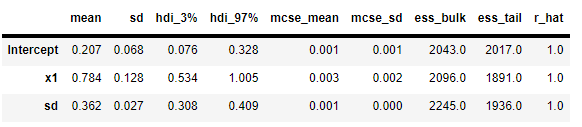



In [40]:
from matplotlib.pyplot import figure
import statsmodels.api as sm

from collections import OrderedDict
import pymc3 as pm
import arviz as az

WARNING (theano.configdefaults): g++ not available, if using conda: `conda install m2w64-toolchain`
WARNING (theano.configdefaults): g++ not detected ! Theano will be unable to execute optimized C-implementations (for both CPU and GPU) and will default to Python implementations. Performance will be severely degraded. To remove this warning, set Theano flags cxx to an empty string.
WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [41]:
path = "data/masked_dataset/train.csv"

data = pd.read_csv(path)
data.describe()

,x1,x2,y
count,100.000000,100.000000,100.000000
mean,0.444403,0.523374,0.554952
std,0.288595,0.291111,0.421430
min,0.000457,0.012779,-0.191714
25%,0.222642,0.265002,0.222144
50%,0.401859,0.527564,0.519598
75%,0.682649,0.784647,0.879761
max,0.996337,0.949549,1.499445


In [42]:
# Plot distribution of features for every group or class defined by variable "groupby" (see below)
# slices_values are feature under consideretion
def compare_variables(df, slice_values, groupby='y', title = "", order = []):
    
    for gl in slice_values:
        fig, ax = plt.subplots(1,2,figsize=[15,5])
        if len(order) > 0:
           sns.violinplot(x=groupby, y=gl, data=df, order = order, height = 5, aspect = 1.7, ax = ax[0]).set_title(title)
        else:
           sns.violinplot(x=groupby, y=gl, data=df,                height = 5, aspect = 1.7, ax = ax[0]).set_title(title) 
        #
        groups = df.groupby(groupby)
        for t in df[groupby].unique():
            dftmp = groups.get_group(t)
            try:
               sns.kdeplot(dftmp[gl], ax = ax[1], shade = True, label = t).set_title(title)
            except Exception as e:
               print("Exception: ", str(e))
        #
        ax[1].set_xlabel(gl)
        ax[1].legend(title = groupby)
        #ax[1].set_xlim(xlim[0], xlim[1])
        ax[0].grid()
    plt.show()
    return plt

# The distributions of x1, x2 and y have the similar support.

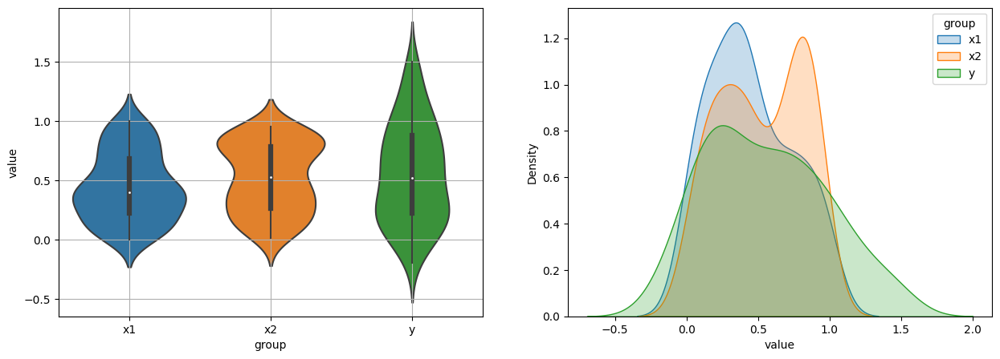

<module 'matplotlib.pyplot' from 'C:\\Users\\alexd\\AppData\\Roaming\\Python\\Python38\\site-packages\\matplotlib\\pyplot.py'>

In [43]:
visual_data = pd.DataFrame()
for col in data.columns:
    dd = data[[col]].copy()
    dd.rename(columns = {col: "value"}, inplace = True)
    dd["group"] = col
    dd['y'] = data["y"].copy()
    visual_data = pd.concat([visual_data, dd])
    
compare_variables(visual_data, slice_values = ["value"], groupby="group", title = "", order = [])

# There is a linear relationship between x1 and y, and also between x2 and y.

<AxesSubplot:xlabel='value', ylabel='y'>

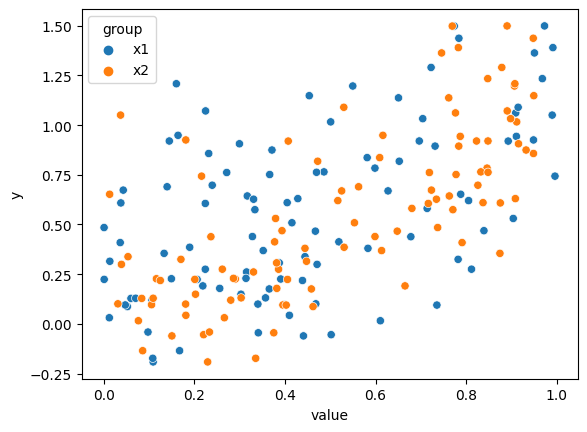

In [44]:
wo_visual_data = visual_data[visual_data["group"] != "y"].copy()
sns.scatterplot(data = wo_visual_data, x = "value", y = "y", hue = "group")

# It seems there is linear relation between x1 and y.

<AxesSubplot:xlabel='x1', ylabel='y'>

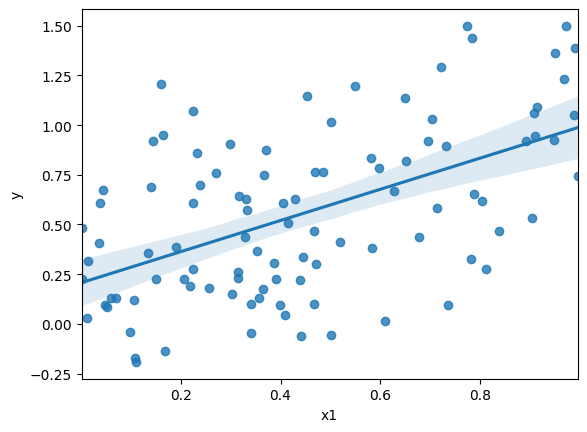

In [45]:
# draw regplot
sns.regplot(x = "x1",
            y = "y",
            data = data)

# There is linear relation between x2 and y.

<AxesSubplot:xlabel='x2', ylabel='y'>

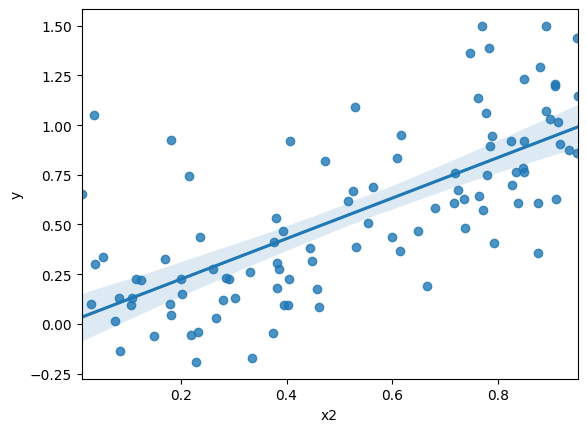

In [46]:
# draw regplot
sns.regplot(x = "x2",
            y = "y",
            data = data)

# There is almost no correlation between x1 and x2. 

Therefore, potentially, both x1 and x2 could be in the model to predict y. 

<AxesSubplot:xlabel='x1', ylabel='x2'>

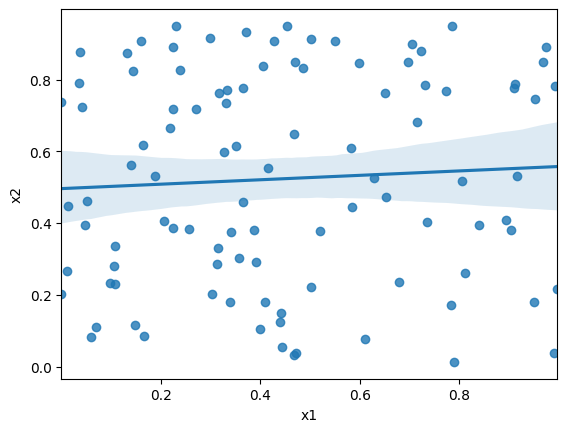

In [47]:
sns.regplot(x = "x1",
            y = "x2",
            data = data)

# Correlation matrix confirms that there is no linear relationship between x1 and x2. 

The above plot confirms that there is no significant nonlinear or linear relatonships.

,x1,x2,y
x1,1.000000,0.061202,0.536305
x2,0.061202,1.000000,0.705965
y,0.536305,0.705965,1.000000


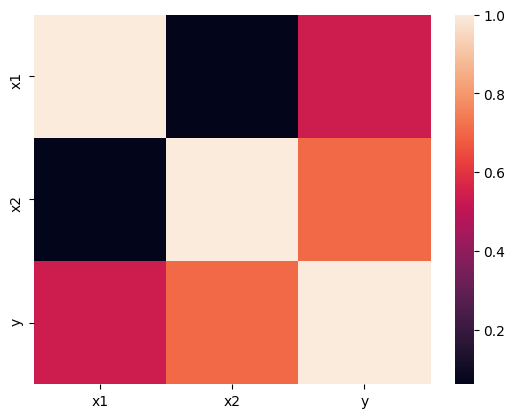

In [48]:
display(data.corr())
sns.heatmap(data.corr());

# In the following cell we perform feature selections using the following feature set  combinations:

- x1;
- x2;
- x1 and x2;
- x1, x2, and x3.

We choose the model based on the smallest value of AIC (see the following Table):

$y = intercept + \beta_1 \cdot x_1 + \beta_2 \cdot x_2$

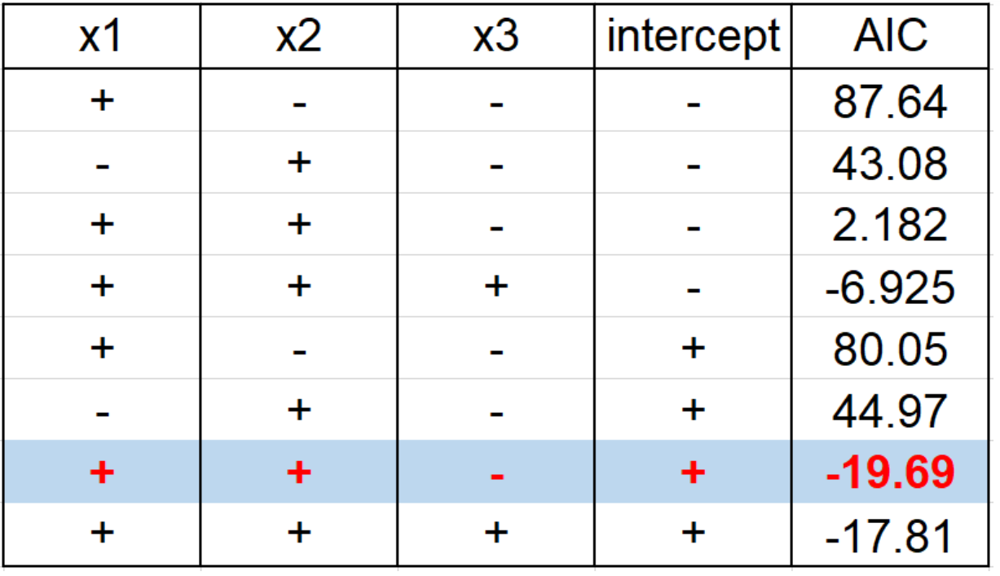

In [49]:
y = data["y"].values
data["x3"] = data["x1"] * data["x2"]

list_of_cols = [["x1"], ["x2"], ["x1", "x2"], ["x1", "x2", "x3"]]
y = data["y"].values.copy() 
for is_intercept in [0, 1]:
 for k, cols in enumerate(list_of_cols):
    X = data[cols].copy()
    #X2 = sm.add_constant(X)
    X2 = X.copy()
    if is_intercept == 1:
       linear_regression = sm.OLS(y, X2.assign(intercept=is_intercept))
    else:
       linear_regression = sm.OLS(y, X2) 
    estimate = linear_regression.fit()
    print("cols: ", cols)
    print("is_intercept: ", is_intercept)
    print(estimate.summary())

cols:  ['x1']
is_intercept:  0
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.715
Model:                            OLS   Adj. R-squared (uncentered):              0.712
Method:                 Least Squares   F-statistic:                              248.4
Date:                Mon, 05 Dec 2022   Prob (F-statistic):                    9.69e-29
Time:                        13:38:35   Log-Likelihood:                         -42.820
No. Observations:                 100   AIC:                                      87.64
Df Residuals:                      99   BIC:                                      90.24
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
----------

In [50]:
cols = ["x1", "x2"]
y = data["y"].values.copy() 

X2 = data[cols].copy()
X2 = X2.assign(intercept=1).values
estimate = sm.OLS(y, X2)
estimate = estimate.fit()

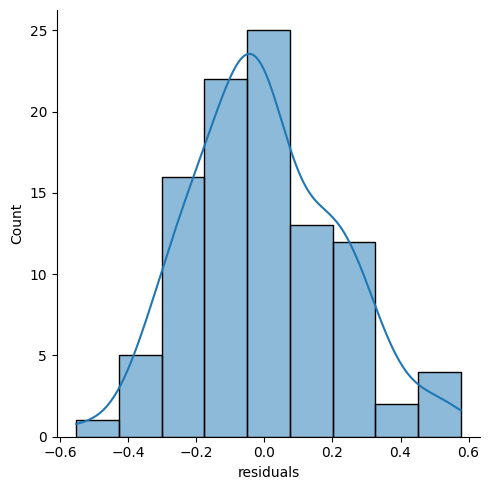

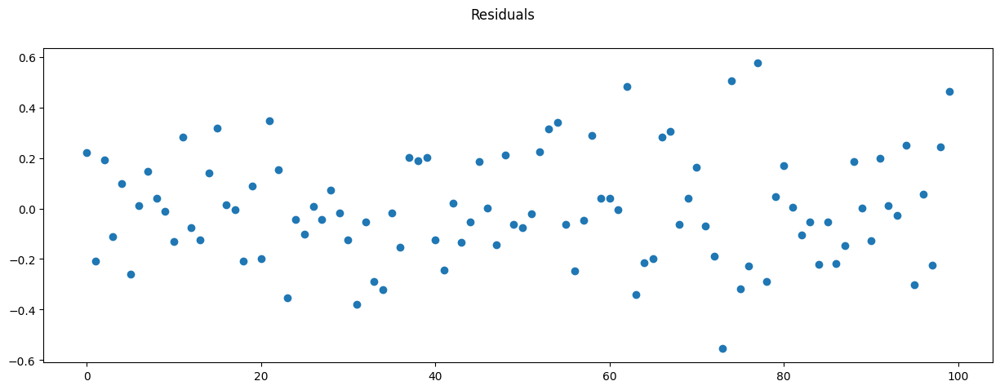

In [51]:
residuals = y - estimate.predict(X2)
residuals_df = pd.DataFrame({"residuals": residuals})
sns.displot(residuals_df, x="residuals", kde=True)


fig, axes = plt.subplots(1, 1, figsize=(15, 5), sharey=True)
fig.suptitle('Residuals')
x= range(len(residuals))
plt.scatter(x, residuals)
#plt.show()

# Perform Shapiro-Wilk test for normality

We do not have sufficient evidence to say that the sample data does not come from a normal distribution. Therefore, we can assume that we can use the likelihood with Gaussian noise.

In [52]:
from scipy.stats import shapiro 
shapiro(residuals)

ShapiroResult(statistic=0.9860782027244568, pvalue=0.37867486476898193)

# Compare models using WAIC.

The Widely Applicable Information Criterion (WAIC) can be used to calculate the goodness-of-fit of a model using numerical techniques. See [Watanabe 2013](http://www.jmlr.org/papers/volume14/watanabe13a/watanabe13a.pdf) for details.

We get three different measurements:

- **waic**: widely available information criterion
- **waic_se**: standard error of waic
- **p_waic**: effective number parameters

In this case we are interested in the WAIC score. We also plot error bars for the standard error of the estimated scores. This gives us a more accurate view of how much they might differ.

Now loop through all the models and calculate the WAIC

Note that, you should **prefer the model(s)** with **lower WAIC**.

We get the following valies of **waic**
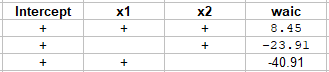

Therefore, the best Bayesian linear regression model using **waic** criteria is 

$y = intercept + \beta \cdot x_1$

In [53]:
def run_models(df, family, list_of_cols = [["x1"], ["x2"], ["x1", "x2"]]):
    """
    Compute trace of parameters for the Bayesian linear regresion model.
    
    """
    y_train = df["y"].copy()  
    models, traces = OrderedDict(), OrderedDict()

    for k, cols in enumerate(list_of_cols):

        nm = f"k{k}"
        X_train = df[cols].copy()

        with pm.Model() as models[nm]:

            print(f"\nRunning: {nm}")
            covariates = pm.Data("covariates", X_train)
            pm.glm.GLM(covariates, y_train, family = family, labels=X_train.columns.tolist())

            traces[nm] = pm.sample(2000, tune=1000, init="advi+adapt_diag", return_inferencedata=True)

    return models, traces

In [67]:
# before when we run the following cell we get the error; "ModuleNotFoundError: No module named 'yaml'"
!pip install pyyaml --user
!pip install tlz --user

ERROR: Could not find a version that satisfies the requirement tlz (from versions: none)
ERROR: No matching distribution found for tlz


In [69]:
!pip install tornado==4.5.1 distributed==1.21 dask-ml[complete] --user

     -------------------------------------- 483.2/483.2 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     -------------------------------------- 441.1/441.1 kB 4.0 MB/s eta 0:00:00
     -------------------------------------- 148.5/148.5 kB 8.6 MB/s eta 0:00:00
     -------------------------------------- 139.0/139.0 kB 8.6 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 55.8/55.8 kB ? eta 0:00:00
     -------------------------------------- 148.2/148.2 kB 4.5 MB/s eta 0:00:00
     -------------------------------------- 148.1/148.1 kB 4.4 MB/s eta 0:00:00
     -------------------------------------- 147.7/147.7 kB 3.0 MB/s eta 0:00:00
     -------------------------------------- 146.9/146.9 kB 4.4 MB/s eta 0:00:00
     -------------------------------------- 143.1/143.1 kB 8.3 MB/s eta 0:00:00
   

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\alexd\\AppData\\Roaming\\Python\\Python38\\site-packages\\tensorflow\\lite\\experimental\\microfrontend\\python\\ops\\_audio_microfrontend_op.so'
Check the permissions.



In [70]:
import tlz


In [71]:
family = pm.glm.families.Normal()
models_lin, traces_lin  = run_models(data, family)

Auto-assigning NUTS sampler...



Running: k0


Initializing NUTS using advi+adapt_diag...


Convergence achieved at 11400
Interrupted at 11,399 [5%]: Average Loss = 113.8
divide by zero encountered in log
invalid value encountered in multiply
invalid value encountered in log
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sd, x1, Intercept]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 158 seconds.
Auto-assigning NUTS sampler...



Running: k1


Initializing NUTS using advi+adapt_diag...


Convergence achieved at 11900
Interrupted at 11,899 [5%]: Average Loss = 109.88
divide by zero encountered in log
invalid value encountered in multiply
invalid value encountered in log
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sd, x2, Intercept]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 173 seconds.
The acceptance probability does not match the target. It is 0.7207900799950698, but should be close to 0.8. Try to increase the number of tuning steps.



Running: k2


Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...


Convergence achieved at 16600
Interrupted at 16,599 [8%]: Average Loss = 98.306
divide by zero encountered in log
invalid value encountered in multiply
invalid value encountered in log
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sd, x2, x1, Intercept]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 233 seconds.


In [72]:
model_trace_dict = dict()
for nm in ["k0", "k1", "k2"]:
    models_lin[nm].name = "model=lin, " + nm
    model_trace_dict.update({models_lin[nm]: traces_lin[nm]})

For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details


array([<AxesSubplot:>], dtype=object)

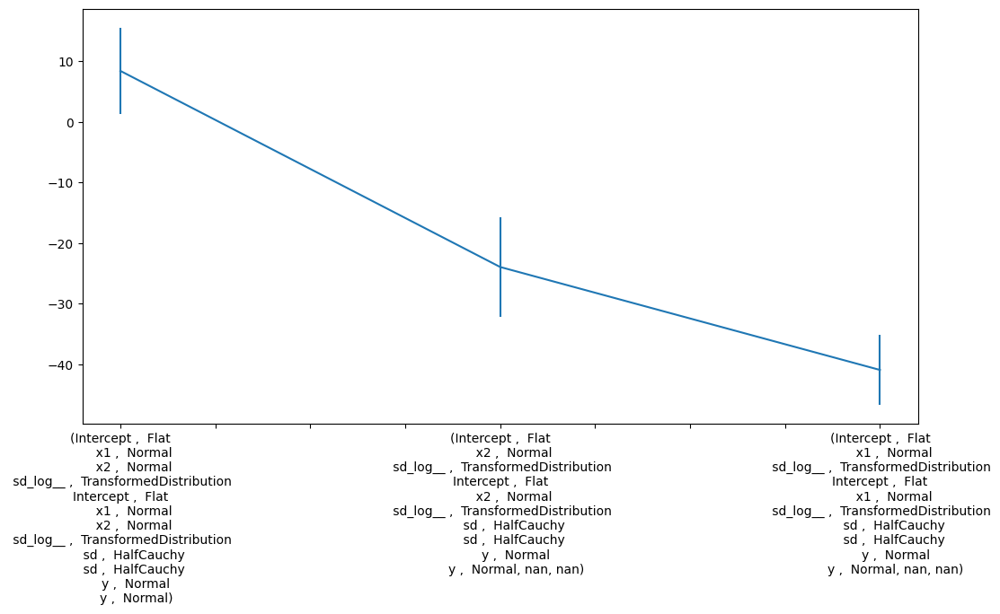

In [85]:
dfwaic = az.compare(model_trace_dict, ic="WAIC")
dfwaic.index = pd.MultiIndex.from_tuples([tuple(str(k).split("~")) for k, v in dfwaic.iterrows()])

dfwaic["waic"].T.plot.line(yerr=dfwaic["se"].T, subplots=True, figsize=(12, 6), sharex=True)

The following analysis was inspired by [pymc doc](https://docs.pymc.io/en/v3/pymc-examples/examples/generalized_linear_models/GLM-model-selection.html).

Compare leave-one-out Cross-Validation (LOO). 

Leave-One-Out Cross-Validation or K-fold Cross-Validation (KFCV) is another quite universal approach for model selection. However, to implement KFCV we need to split the data into parts repeatly and fit the model on every partition. It can be very time consumming (computation time increase roughly as a factor of K). Here we are applying the numerical approach using the posterier trace as suggested in [Vehtari et al](https://link.springer.com/article/10.1007/s11222-016-9696-4).

**Note that**:

We should prefer the model(s) with lower LOO. You can see that LOO is nearly identical with WAIC. That’s because WAIC is asymptotically equal to LOO. 

rank  \
Intercept   Flat\n       x1   Normal\n       x2   Normal\n sd_log__                    TransformedDistribution\nIntercept   Flat\n       x1     Normal\n       x2                    Normal\n sd_log__       TransformedDistribution\n       sd   HalfCauchy\n       sd   HalfCauchy\n        y   Normal\n        y   Normal     0   
            Flat\n       x2   Normal\n sd_log__   TransformedDistribution\nIntercept   Flat\n       x2                      Normal\n sd_log__   TransformedDistribution\n       sd   HalfCauchy\n       sd   HalfCauchy\n        y                Normal\n        y       Normal                 NaN                 NaN         1   
            Flat\n       x1   Normal\n sd_log__   TransformedDistribution\nIntercept   Flat\n       x1                      Normal\n sd_log__   TransformedDistribution\n       sd   HalfCauchy\n       sd   HalfCauchy\n        y                Normal\n        y       Normal                 NaN                 NaN         2   

                                                                                                                                                                                                                                                                                                                                    loo  \
Intercept   Flat\n       x1   Normal\n       x2   Normal\n sd_log__                    TransformedDistribution\nIntercept   Flat\n       x1     Normal\n       x2                    Normal\n sd_log__       TransformedDistribution\n       sd   HalfCauchy\n       sd   HalfCauchy\n        y   Normal\n        y   Normal   8.431980   
            Flat\n       x2   Normal\n sd_log__   TransformedDistribution\nIntercept   Flat\n       x2                      Normal\n sd_log__   TransformedDistribution\n       sd   HalfCauchy\n       sd   HalfCauchy\n        y                Normal\n        y       Normal                 NaN                 NaN     -23.926833   
            Flat\n       x1   Normal\n sd_log__   TransformedDistribution\nIntercept   Flat\n       x1                      Normal\n sd_log__   TransformedDistribution\n       sd   HalfCauchy\n       sd   HalfCauchy\n        y                Normal\n        y       Normal                 NaN                 NaN     -40.918729   

                                                                                                                                                                                                                                                                                                                                 p_loo  \
Intercept   Flat\n       x1   Normal\n       x2   Normal\n sd_log__                    TransformedDistribution\nIntercept   Flat\n       x1     Normal\n       x2                    Normal\n sd_log__       TransformedDistribution\n       sd   HalfCauchy\n       sd   HalfCauchy\n        y   Normal\n        y   Normal  4.374878   
            Flat\n       x2   Normal\n sd_log__   TransformedDistribution\nIntercept   Flat\n       x2                      Normal\n sd_log__   TransformedDistribution\n       sd   HalfCauchy\n       sd   HalfCauchy\n        y                Normal\n        y       Normal                 NaN                 NaN      3.529960   
            Flat\n       x1   Normal\n sd_log__   TransformedDistribution\nIntercept   Flat\n       x1                      Normal\n sd_log__   TransformedDistribution\n       sd   HalfCauchy\n       sd   HalfCauchy\n        y                Normal\n        y       Normal                 NaN                 NaN      2.569231   

                                                                                                                                                                                                                                                                                                                                  d_loo  \
Intercept   Flat\n       x1   Normal

array([<AxesSubplot:>], dtype=object)

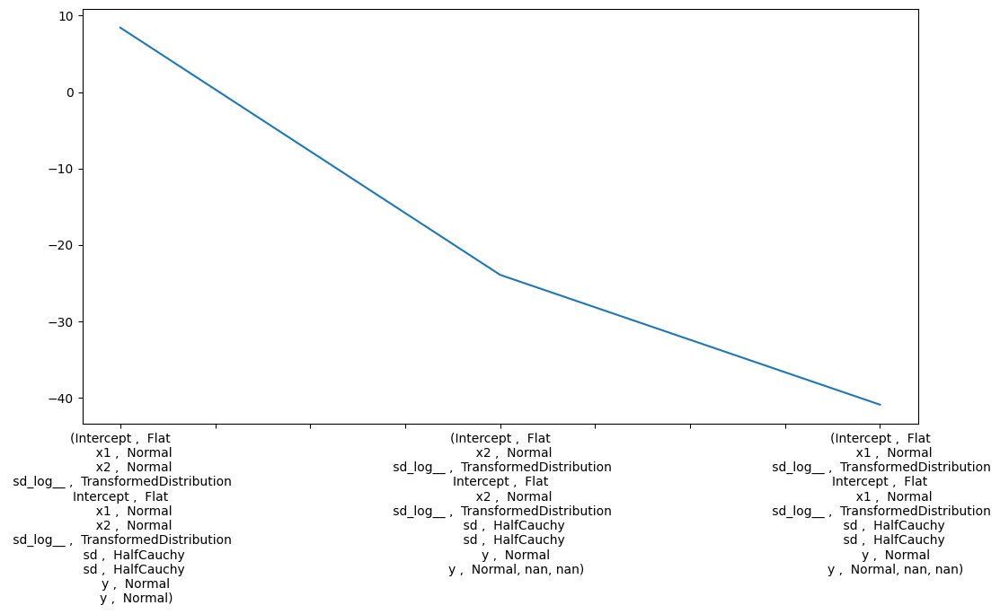

In [74]:
dfloo = az.compare(model_trace_dict, ic="LOO")
dfloo.index = pd.MultiIndex.from_tuples([tuple(str(k).split("~")) for k, v in dfloo.iterrows()])

display(dfloo)

dfloo["loo"].plot.line(yerr=dfloo["se"].unstack().T, subplots=True,figsize=(12, 6), sharex=True)

In [75]:
X_train = data[["x1", "x2"]].copy()
y_train = data["y"].copy()


formula = "y ~ x1 + x2"
# Context for the model
with pm.Model() as normal_model:
    #data = pm.Data("data", data[["x1", "x2"]])
    # The prior for the data likelihood is a Normal Distribution
    
    family = pm.glm.families.Normal()
    
    # Creating the model requires a formula and data (and optionally a family)
    #model = pm.GLM.from_formula(formula, data = data, family = family, labels=["x1", "x2"])
    covariates = pm.Data("covariates", X_train)
    pm.glm.GLM(covariates, y_train, family = family, labels=X_train.columns.tolist())

    
    # Perform Markov Chain Monte Carlo sampling letting PyMC3 choose the algorithm
    normal_trace = pm.sample(draws=2000, chains = 2, tune = 500)

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
divide by zero encountered in log
invalid value encountered in multiply
invalid value encountered in log
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [sd, x2, x1, Intercept]


Sampling 2 chains for 500 tune and 2_000 draw iterations (1_000 + 4_000 draws total) took 144 seconds.


In [76]:
X_train = data[["x1"]].copy()#, "x2"]].copy()
y_train = data["y"].copy()

# Context for the model
with pm.Model() as normal_model:
    #data = pm.Data("data", data[["x1", "x2"]])
    # The prior for the data likelihood is a Normal Distribution
    
    family = pm.glm.families.Normal()
    
    covariates = pm.Data("covariates", X_train)
    pm.glm.GLM(covariates, y_train, family = family, labels=X_train.columns.tolist())

    # Perform Markov Chain Monte Carlo sampling letting PyMC3 choose the algorithm
    normal_trace = pm.sample(draws=2000, chains = 2, tune = 500)

In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
divide by zero encountered in log
invalid value encountered in multiply
invalid value encountered in log
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [sd, x1, Intercept]


Sampling 2 chains for 500 tune and 2_000 draw iterations (1_000 + 4_000 draws total) took 105 seconds.


The function `traceplot` from PyMC3 is just an alias for `plot_trace` from ArviZ. Please switch to `pymc3.plot_trace` or `arviz.plot_trace`.
Got error No model on context stack. trying to find log_likelihood in translation.
Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
Got error No model on context stack. trying to find log_likelihood in translation.


array([[<AxesSubplot:title={'center':'Intercept'}>,
        <AxesSubplot:title={'center':'Intercept'}>],
       [<AxesSubplot:title={'center':'x1'}>,
        <AxesSubplot:title={'center':'x1'}>],
       [<AxesSubplot:title={'center':'sd'}>,
        <AxesSubplot:title={'center':'sd'}>]], dtype=object)

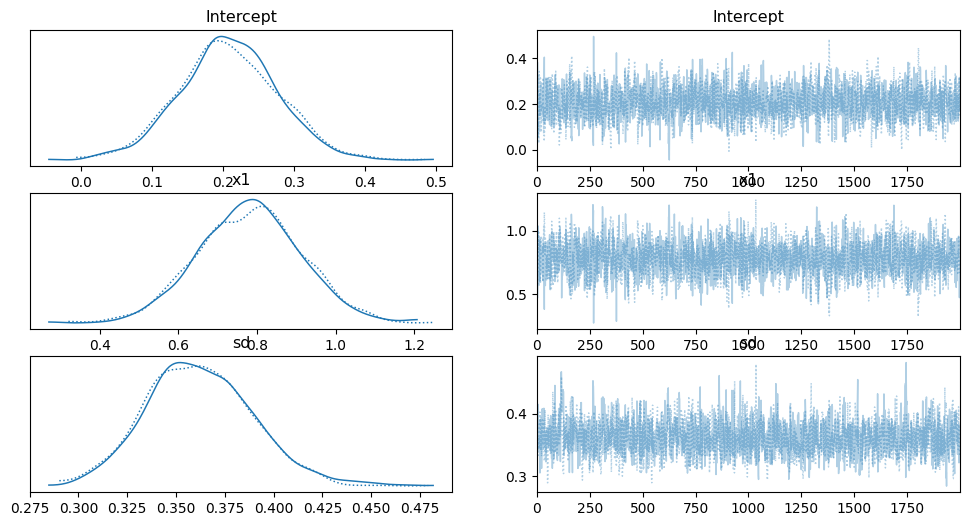

In [77]:
pm.traceplot(normal_trace)

# Visualization of HDI for the parameters of the Bayesian linear regression model with the intercept and input x1

Got error No model on context stack. trying to find log_likelihood in translation.
Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.


array([<AxesSubplot:title={'center':'Intercept'}>,
       <AxesSubplot:title={'center':'x1'}>,
       <AxesSubplot:title={'center':'sd'}>], dtype=object)

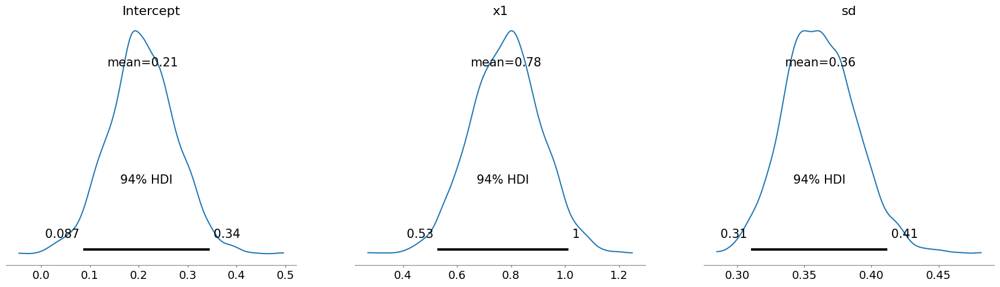

In [78]:
pm.plot_posterior(normal_trace)

In [79]:
pm.summary(normal_trace)

Got error No model on context stack. trying to find log_likelihood in translation.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.207,0.069,0.087,0.345,0.002,0.001,1960.0,1984.0,1.0
x1,0.781,0.131,0.528,1.012,0.003,0.002,1939.0,2195.0,1.0
sd,0.362,0.027,0.310,0.412,0.001,0.000,1530.0,1510.0,1.0


In [80]:
X_test = X_train.copy()

pm.set_data({"covariates": X_train}, model=normal_model)
ppc = pm.sample_posterior_predictive(normal_trace, model=normal_model, samples=500)
ppc


samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample


{'y': array([[ 1.02168122,  1.16664245,  0.35754502, ..., -0.05227251,
          0.97487486,  1.35265718],
        [ 1.07035624,  1.20519398,  0.94894497, ..., -0.1296621 ,
          0.62531694,  0.44281552],
        [ 1.15666016,  1.17314836,  0.34763729, ...,  0.31647077,
          0.52472502,  0.5887935 ],
        ...,
        [ 0.60659183,  1.49693203,  1.31015096, ...,  0.84224603,
          0.43450677,  1.1639844 ],
        [ 0.50219874,  0.31014936,  0.91017981, ...,  0.48216879,
          0.75233939,  0.87063863],
        [ 1.03619521,  1.28456097,  0.38242811, ...,  0.98150709,
          0.80664796,  0.88275109]])}

In [81]:
outsample = pd.DataFrame(ppc["y"])
outsample.describe()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,...,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000
mean,0.823969,0.958427,0.623525,0.256132,0.653555,0.480577,0.437420,0.219320,0.605934,0.471041,...,0.574386,0.553742,0.561616,0.489220,0.281227,0.296719,0.574100,0.532107,0.550106,0.805263
std,0.368102,0.363761,0.393554,0.376446,0.364040,0.377612,0.371015,0.357285,0.374373,0.379378,...,0.365041,0.357620,0.361765,0.361800,0.369232,0.374326,0.383740,0.365048,0.384030,0.381818
min,-0.578333,-0.149422,-0.655956,-1.086563,-0.352125,-0.909358,-0.724827,-0.991991,-0.590466,-0.609891,...,-0.510803,-0.524187,-0.711783,-0.507475,-0.929211,-0.849933,-0.717462,-0.590322,-0.719618,-0.310753
25%,0.585135,0.722391,0.349105,0.012392,0.424860,0.228567,0.200842,-0.046246,0.347099,0.222755,...,0.335733,0.324741,0.328709,0.244715,0.044675,0.050602,0.331828,0.296380,0.318927,0.528898
50%,0.826140,0.969389,0.628433,0.279072,0.672471,0.472101,0.433607,0.240259,0.609368,0.473710,...,0.557750,0.559952,0.559998,0.473247,0.303721,0.305004,0.572478,0.541793,0.531577,0.795640
75%,1.079581,1.211724,0.915228,0.512711,0.886599,0.733814,0.683830,0.470570,0.861027,0.736581,...,0.798941,0.792278,0.792076,0.751820,0.534225,0.549471,0.847248,0.791480,0.801881,1.072471
max,1.827316,1.974022,1.728331,1.412337,1.733615,1.452819,1.406550,1.321850,1.553496,1.420114,...,1.778769,1.671844,1.698640,1.430641,1.496824,1.422115,1.720215,1.379689,1.744329,2.218339


# Illustration of the posterior predictive distribution of y

We need to use these values to obtain the average utility function to make the decision.

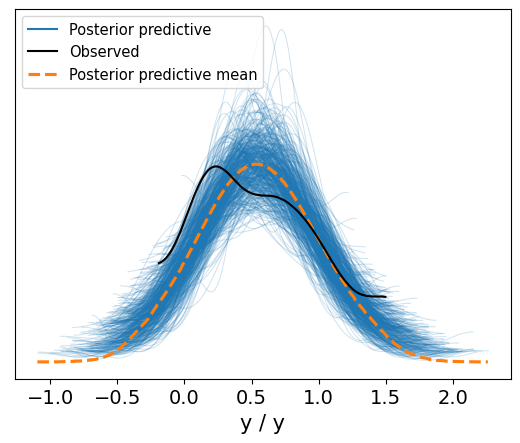

In [82]:
az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=normal_model));